In [1]:
from typing import Literal
import matplotlib
import matplotlib.pyplot as plt
import shutil
import copy
import seaborn as sns
from decimal import Decimal
import numpy as np
import pandas as pd
import geopandas as gpd
import joypy

from experiment.obj_file import OBJFile

In [2]:
from experiment.scenario import *
from experiment_setup.exp_utrecht_10_492_594_v2_setup import *

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


# Setup

Set up experiment:

In [3]:
load_existing_experiment = True

if not load_existing_experiment:
    e = Experiment(experiment_name, experiment_dirpath, default_config, scenario_settings, scene_parts)

    print("\nSetting up experiment:")
    e.setup()
else:
    print("\nLoading existing experiment:")
    e = Experiment.load(experiment_dirpath / experiment_name, load_scenarios=True)


Loading existing experiment:

Loading experiment configuration ...
Initializing experiment ...
Loading scenarios ...
- 143 scenarios


## Load Data

In [4]:
e.load_summary_stats()

Loading summary statistics from file `summary_statistics.csv` ...


In [5]:
e.load_final_results()

Loading evaluation results from file `evaluation_results.csv` ...


In [6]:
e.summary_stats["Point Density"] = e.summary_stats["target_density"].apply(lambda x: np.round(x, decimals=1))
e.summary_stats["Point Density Str"] = e.summary_stats["Point Density"].astype(str)
e.summary_stats["Error Level"] = (e.summary_stats["error_level"] * 100).astype(int).astype(str) + "%"

In [7]:
results = e.results.join(e.summary_stats, on="scenario")

### Join BAG data

In [8]:
footprints = gpd.read_file(default_config["reconstruction_config"]["building_footprints_filepath"])
footprints = footprints.set_index("identificatie")
sum(footprints.bag_gebruiksdoel.isna())

112

In [9]:
results = results.join(footprints, on="identificatie", how="left", rsuffix="_fp", validate="many_to_one")

In [10]:
results.shape

(142264, 364)

In [11]:
results["vol_est"] = results.h_70p_in * results.b3_opp_grond

In [12]:
results["share_flat_roof"] = results.b3_opp_dak_plat / (results.b3_opp_dak_plat + results.b3_opp_dak_schuin)

In [13]:
results["gebruiksdoel"] = results.bag_gebruiksdoel.apply(lambda x: x.split(",") if isinstance(x, str) else [])

In [14]:
results_use = results.explode("gebruiksdoel")

In [15]:
use_type_translation = pd.read_csv(r"C:\Users\Florian\OneDrive - TUM\Universität\24\Master's Thesis\Data\BAG_building_use_types_Dutch_English_mapping.csv")

In [16]:
use_type_dict = dict(zip([t.lower() for t in list(use_type_translation.iloc[:, 0])], list(use_type_translation.iloc[:, 1])))
use_type_dict

{'woonfunctie': 'Residential',
 'overige gebruiksfunctie': 'Miscellaneous',
 'industriefunctie': 'Industrial',
 'logiesfunctie': 'Lodging',
 'winkelfunctie': 'Retail',
 'kantoorfunctie': 'Office',
 'bijeenkomstfunctie': 'Gatherings',
 'gezondheidszorgfunctie': 'Healthcare',
 'onderwijsfunctie': 'Education',
 'sportfunctie': 'Sports',
 'celfunctie': 'Prison'}

In [17]:
results_use = results_use.rename(columns={"gebruiksdoel": "gebruiksdoel_nl"})

In [18]:
results_use["gebruiksdoel_en"] = results_use.gebruiksdoel_nl.apply(lambda x: use_type_dict[x] if isinstance(x, str) else x)

In [19]:
sum(footprints.oorspronkelijkbouwjaar < 1500)

307

### Find Columns

Look for columns present in the summary stats table.

In [46]:
filter = "h_70p"
col_names = [col_name for col_name in list(results.columns) if filter in col_name]
print(", ".join(col_names))
print(len(col_names))

h_70p_in, h_70p_out, h_70p_diff, h_70p_abs_diff, h_70p_ratio, h_70p_norm_diff, h_70p_norm_abs_diff, h_70p_out_count, h_70p_out_mean, h_70p_out_std, h_70p_out_min, h_70p_out_25%, h_70p_out_50%, h_70p_out_75%, h_70p_out_max, h_70p_mean_diff, h_70p_median_diff, h_70p_mean_abs_diff, h_70p_median_abs_diff, h_70p_rms_diff, h_70p_mean_norm_diff, h_70p_norm_mean_diff, h_70p_mean_norm_abs_diff, h_70p_norm_mean_abs_diff
24


## Functions

### Outlier Functions

Basic functions that implement different methods to detect outliers in a series of values.

In [21]:
def is_outlier(data: np.ndarray, threshold: float = 1e3) -> np.ndarray[bool]:
    """
    Check for outliers in data

    Outliers are values whose absolute distance from the median is larger than the median absolute distance from the
    median by a factor that exceeds the threshold value. Adapted from https://stackoverflow.com/a/16562028
    """
    distance_from_median = np.abs(data - np.nanmedian(data))
    median_distance_from_median = np.nanmedian(distance_from_median)
    ratio = distance_from_median / median_distance_from_median if median_distance_from_median else np.zeros(len(distance_from_median))
    return ratio > threshold

In [22]:
def modified_z_score(data: np.ndarray, threshold: float = 3.5) -> np.ndarray[bool]:
    """
    Identify outliers in data using the Modified Z-Score method based on the Median Absolute Deviation (MAD).

    Parameters:
    - data: np.ndarray, input array of data
    - threshold: float, the threshold for defining an outlier (default is 3.5)

    Returns:
    - np.ndarray[bool]: boolean array where True indicates an outlier
    """
    # Calculate the median of the data
    median = np.nanmedian(data)

    # Calculate the absolute deviations from the median
    mad = np.nanmedian(np.abs(data - median))

    # Avoid division by zero
    if mad == 0:
        return np.zeros_like(data, dtype=bool)

    # Modified Z-Score formula
    modified_z_scores = 0.6745 * (data - median) / mad

    # Return boolean array where True indicates an outlier
    return np.abs(modified_z_scores) > threshold

In [23]:
def iqr_outliers(data: np.ndarray, threshold=1.5) -> np.ndarray[bool]:
    """
    Identify outliers in data using the Interquartile Range (IQR) method.

    Parameters:
    - data: np.ndarray, input array of data

    Returns:
    - np.ndarray[bool]: boolean array where True indicates an outlier
    """
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = np.nanpercentile(data, 25)
    Q3 = np.nanpercentile(data, 75)

    # Calculate the IQR
    IQR = Q3 - Q1

    # Determine the lower and upper bounds for outliers
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR

    # Return boolean array where True indicates an outlier
    return (data < lower_bound) | (data > upper_bound)

Functions to identify outliers of each individual scenario, i.e., combination of density and error level.

In [24]:
def is_outlier_by_group(
        data: np.ndarray | pd.DataFrame,
        colname: str,
        outlier_func=modified_z_score,
        threshold: float | None = None,
        groups: list[str] | None = None
) -> np.ndarray[bool] | pd.Series:

    if groups is None:
        error_level_colname = "error_level"
        density_colname = "Point Density"
        groups = [density_colname, error_level_colname]

    kwargs = {}
    if threshold is not None:
        kwargs["threshold"] = threshold

    # data = data[[density_colname, error_level_colname, col]].copy()

    grouped = data[[*groups, colname]].groupby(groups)
    reselected = grouped[[*groups, colname]]
    outlier_check = reselected.apply(lambda x: outlier_func(x[colname], **kwargs), include_groups=True)

    outlier_check = outlier_check.reset_index().set_index(["scenario", "identificatie"])

    return outlier_check[colname]

In [25]:
def is_outlier_by_group_2(
        data: np.ndarray | pd.DataFrame,
        col: str,
        outlier_func=modified_z_score,
        threshold: float | None = None
) -> np.ndarray[bool] | pd.Series:
    error_level_colname = "error_level"
    density_colname = "Point Density"

    kwargs = {}
    if threshold is not None:
        kwargs["threshold"] = threshold

    error_levels = data[error_level_colname].unique()
    density_levels = data[density_colname].unique()

    # Create a copy so the original dataframe is not altered
    data = data[[density_colname, error_level_colname, col]].copy()

    for density_level in density_levels:
        for error_level in error_levels:
            group_filter = (data[density_colname] == density_level) & (data[error_level_colname] == error_level)
            data.loc[group_filter, "is_outlier"] = outlier_func(data.loc[group_filter, col], **kwargs)

    data["is_outlier"] = data["is_outlier"].astype(bool)

    return data["is_outlier"]

Functions to generate pivot tables showing the number of outliers in each scenario.

In [26]:
def outlier_distribution_across_dataset(metric, threshold, outlier_func=modified_z_score):
    error_level_colname = "error_level"
    density_colname = "Point Density"

    data = results[[density_colname, error_level_colname, metric]].copy()
    outlier_colname = metric + "_outlier"
    data[outlier_colname] = outlier_func(data[metric], threshold)

    print(f"\nTotal number of outliers: {sum(data[outlier_colname])}")

    return data[[density_colname, error_level_colname, outlier_colname]].groupby([density_colname, error_level_colname]).agg("sum").reset_index().pivot(index=error_level_colname, columns=density_colname, values=outlier_colname).sort_index(ascending=False)

In [27]:
def outlier_distribution_within_scenarios(metric: str, threshold: float | None = None, outlier_func: Callable = modified_z_score):
    error_level_colname = "error_level"
    density_colname = "Point Density"
    data = results[[density_colname, error_level_colname, metric]].copy()

    kwargs = {}
    if threshold is not None:
        kwargs["threshold"] = threshold

    # grouped = data[[density_colname, error_level_colname, metric]].groupby([density_colname, error_level_colname])
    # reselected = grouped[[density_colname, error_level_colname, metric]]
    # outlier_check = reselected.apply(lambda x: outlier_func(x[metric], **kwargs), include_groups=True)
    # aggregated = outlier_check.groupby([density_colname, error_level_colname]).agg("sum").reset_index()
    # pivot = aggregated.pivot(index=error_level_colname, columns=density_colname, values=metric).sort_index(ascending=False)
    # return pivot

    # Newer version based on is_outlier_by_group()
    data["is_outlier"] = is_outlier_by_group(data, metric, outlier_func=outlier_func, **kwargs)
    aggregated = data[[density_colname, error_level_colname, "is_outlier"]].groupby([density_colname, error_level_colname]).agg("sum").reset_index()
    pivot = aggregated.pivot(index=error_level_colname, columns=density_colname, values="is_outlier").sort_index(ascending=False)
    return pivot

### Misc Functions

In [28]:
def is_between(s: pd.Series, min, max, open=False):
    if open:
        return (s > min) & (s < max)
    else:
        return (s >= min) & (s <= max)

In [29]:
# Should (?) do the same as np.round(decimals=1) for positive floats
# def r1dp(x):
    # return floor(x*10 + 0.5)/10

### Plotting Functions

In [30]:
def heatmap(col_name, normalize_to=None, ax=None, annot=None, fmt="2g", square=True, **kwargs):
    data = e.summary_stats.pivot(
        index="error_level", columns="Point Density", values=col_name
    ).sort_index(ascending=False)

    if normalize_to is not None:
        data = data / normalize_to

    density_levels_one_decimal_place = [floor(2 ** (i / 2) * 10 + 0.5) / 10 for i in range(2, 14)]
    xticklabels = [f"{v:.3g}" for v in density_levels_one_decimal_place]
    yticklabels = [f"{int(10 * (10 - v))}%" for v in range(0, 11)]

    ax = sns.heatmap(
        data,
        ax=ax,
        xticklabels=xticklabels,
        yticklabels=yticklabels,
        annot=annot,
        fmt=fmt,
        square=square,
        **kwargs
    )

    ax.tick_params(axis="y", rotation=0)
    ax.set_xlabel("Point Density [pt m$^{-2}$]")
    ax.set_ylabel("Error Level")

    return ax

In [31]:
def lineplot(
        data: pd.DataFrame,
        metric: str,
        density_range: tuple | None = None,
        error_range: tuple | None = None,
        ax: plt.axis = None,
        x_log: bool = True,
        y_log: bool = False,
        y_ticks: list[float] = None,
        legend: bool = True,
        legend_ncols: int = 2,
        grid: bool = True,
        estimator: str = "mean",
        outlier_func: Callable | None = None,
        outlier_threshold: float | None = None,
        outlier_method: Literal["group", "dataset"] = "group",
        **kwargs
):
    """_summary_

    Args:
        data (pd.DataFrame): _description_
        metric (str): _description_
        density_range (tuple | None, optional): _description_. Defaults to None.
        error_range (tuple | None, optional): _description_. Defaults to None.
        ax (plt.axis, optional): _description_. Defaults to None.
        x_log (bool, optional): _description_. Defaults to True.
        y_log (bool, optional): Apply logarithmic scale to the vertical axis. Only works if subplots do not `sharey=True`, otherwise messes up data and / or ranges. Defaults to False.
        y_ticks (list[float], optional): Optional ticks for vertical axis in case of logarithmic scaling. Defaults to None.
        legend (bool, optional): _description_. Defaults to True.
        grid (bool, optional): _description_. Defaults to True.
        estimator (str, optional): _description_. Defaults to "mean".
        outlier_func (Callable | None, optional): _description_. Defaults to None.
        outlier_threshold (float | None, optional): _description_. Defaults to None.
        outlier_method (str[&quot;group&quot;, &quot;dataset&quot;], optional): _description_. Defaults to "group".

    Raises:
        ValueError: _description_

    Returns:
        _type_: _description_
    """
    
    if outlier_func is not None:
        if outlier_method == "group":
            data = data[~is_outlier_by_group(data, metric, outlier_func=outlier_func, threshold=outlier_threshold)]
        elif outlier_method == "dataset":
            data = data[~outlier_func(data[metric], outlier_threshold)]
        else:
            raise ValueError("Outlier detection method must be one of `group`, `dataset`.")

    if density_range is not None:
        data = data[is_between(data["Point Density"], *density_range)]
    if error_range is not None:
        data = data[is_between(data["error_level"], *error_range)]

    data = data[["Point Density", "Error Level", metric]]

    ax = sns.lineplot(ax=ax, data=data, x="Point Density", y=metric, hue="Error Level", style="Error Level", markers=True, dashes=False, estimator=estimator, **kwargs)
    
    if grid:
        ax.grid(True)
    
    if not legend:
        ax.get_legend().remove()
    else:
        ax.legend(ncols=legend_ncols, title="Error Level")

    if x_log:
        ax.set_xscale("log")
        ax.set_xticks([2**i for i in range(1, 7)])
        ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

    if y_log:
        ax.set_yscale("log")
        if y_ticks is not None:
            ax.set_yticks(y_ticks)
            ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

    # ax.set_ylim(bottom=0)

    return ax

In [32]:
def hist_grid(
        metric: str,
        density_range: tuple | None = None,
        error_range: tuple | None = None,
        row: str = "Error Level",
        col: str = "Point Density",
        height: float = 2,
        margin_titles: bool = True,
        outlier_func: Callable | None = modified_z_score,
        outlier_threshold: float | None = None,
        **kwargs
):
    data = results[["Point Density", "Error Level", "error_level", metric]]

    if density_range is not None:
        data = data[is_between(data["Point Density"], *density_range)]
    if error_range is not None:
        data = data[is_between(data["error_level"], *error_range)]

    if outlier_func is not None:
        data = data[~is_outlier_by_group(data, metric, outlier_func=outlier_func, threshold=outlier_threshold)]

    g = sns.FacetGrid(data, row=row, col=col, height=height, margin_titles=margin_titles, **kwargs)
    g.map(sns.histplot, metric)

#### Ridge Plots

In [33]:
def ridgeplot(
    data,
    x,
    row,
    hue: str | None = None,
    col: str | None = None,
    kind: Literal["ridge", "hist"] = "ridge",
    bw_adjust: float = 0.5,  # only for "ridge"
    n_bins: int = 40,  # only for "hist"
    height: float = 0.5,
    aspect: float = 14,
    hspace: float = -0.8,
    label_x: float = 0,
    label_y: float = 0.08,
    horizontal_alignment: Literal["left", "center", "right"] = "left",
    palette: str = "husl",
    fill: bool = True,
    border_line: bool = True,
    alpha: float = 1,
    xlabel: str | None = None,
    legend_labels: bool = True,
    **kwargs
):
    
    with sns.axes_style("white", rc={"axes.facecolor": (0, 0, 0, 0)}):
        if hue is None:
            hue = row
        g = sns.FacetGrid(data, row=row, col=col, hue=hue, aspect=aspect, height=height, palette=palette)

        if kind == "ridge":
            # clip_on=False ensures that overlapping distributions are not clipped
            g.map(sns.kdeplot, x, bw_adjust=bw_adjust, clip_on=False, fill=fill, alpha=alpha, linewidth=1.5, **kwargs)
            if border_line:
                g.map(sns.kdeplot, x, bw_adjust=bw_adjust, clip_on=True, color="w", linewidth=2, **kwargs)
        
        elif kind == "hist":
            range_min, range_max = data[x].min(), data[x].max()
            binrange = (range_min, range_max)
            binwidth = (range_max - range_min) / n_bins

            g.map(sns.histplot, x, binwidth=binwidth, binrange=binrange, **kwargs)
            
        else:
            raise ValueError(f"Argument `kind` must be one of ['ridge', 'hist'], not `{kind}`.")

        if legend_labels:
            # Define and use a simple function to label the plot in axes coordinates
            def label(x, color, label):
                ax = plt.gca()
                ax.text(x=label_x, y=label_y, s=label, fontweight="bold", color=color,
                        ha=horizontal_alignment, va="center", transform=ax.transAxes)

            g.map(label, x)

        g.figure.subplots_adjust(hspace=hspace)

        g.set_titles("")
        g.set(yticks=[], ylabel="")
        if xlabel is not None:
            g.set(xlabel=xlabel)
        g.despine(bottom=True, left=True)
        
        # sns.despine(ax=list(g.axes_dict.values())[-1], left=False, bottom=True)

    return g

In [34]:
# Use ridgeplot() with kind="hist" instead

def ridgeplot_hist(data, x, row, n_bins: int = 40, height: float = 0.5, aspect: float = 14, hspace: float = -0.8):
    
    with sns.axes_style("white", rc={"axes.facecolor": (0, 0, 0, 0)}):
        g = sns.FacetGrid(data, row=row, hue=row, aspect=aspect, height=height)

        range_min, range_max = data[x].min(), data[x].max()
        binrange = (range_min, range_max)
        binwidth = (range_max - range_min) / n_bins

        g.map(sns.histplot, x, binwidth=binwidth, binrange=binrange)

        # Define and use a simple function to label the plot in axes coordinates
        def label(x, color, label):
            ax = plt.gca()
            ax.text(0, .08, label, fontweight="bold", color=color,
                    ha="left", va="center", transform=ax.transAxes)

        g.map(label, x)

        g.figure.subplots_adjust(hspace=hspace)

        g.set_titles("")
        g.set(yticks=[], ylabel="")
        g.despine(bottom=True, left=True)

    return g

In [35]:
def ridgeplot_errors(metric, density, outlier_func: Callable | None = modified_z_score):

    data = results[results["Point Density"] == density]
    data = data[~is_outlier_by_group(data, metric, outlier_func=outlier_func)]

    g = ridgeplot(data, metric, "Error Level")

    return g

In [36]:
def ridgeplot_hist_errors(metric, density, n_bins=40, outlier_func: Callable | None = modified_z_score):

    data = results[results["Point Density"] == density]
    data = data[~is_outlier_by_group(data, metric, outlier_func=outlier_func)]

    g = ridgeplot_hist(data, metric, "Error Level", n_bins)

    return g

### Function Tests

In [37]:
is_outlier_by_group(results, "h_max_abs_diff", threshold=1e2).sum()

215

In [38]:
is_outlier_by_group_2(results, "h_max_abs_diff", threshold=1e2).sum()

215

## Outlier Check

### Outliers in Metrics

#### Across Dataset


Total number of outliers: 189


<Axes: xlabel='Point Density', ylabel='error_level'>

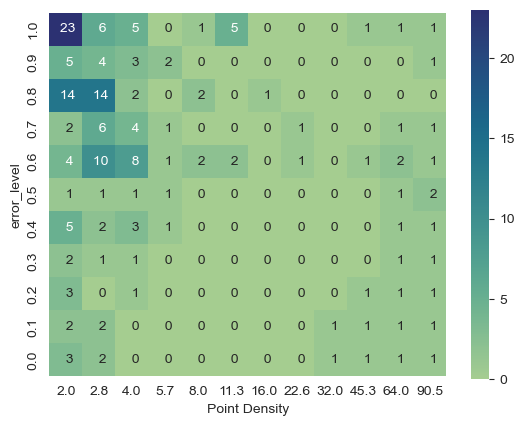

In [174]:
metric = "h_max_abs_diff"
threshold = 1e2

sns.heatmap(outlier_distribution_across_dataset(metric, threshold), annot=True, square=True, cmap="crest", fmt="3g")


Total number of outliers: 19233


<Axes: xlabel='Point Density', ylabel='error_level'>

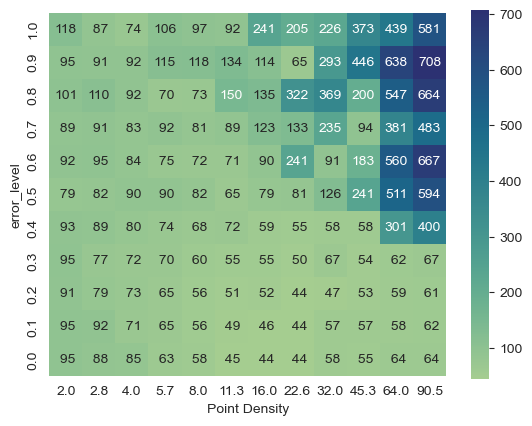

In [203]:
metric = "h_max_abs_diff"
threshold = 3.5

sns.heatmap(outlier_distribution_across_dataset(metric, threshold, outlier_func=modified_z_score), annot=True, square=True, cmap="crest", fmt="3g")

#### Within Scenarios


rms_min_dist_22
---------------------------------------------

modified_z_score: 8553
iqr_outliers: 10151
is_outlier (5.0): 9005
is_outlier (10.0): 2642
is_outlier (100.0): 42
is_outlier (1000.0): 0


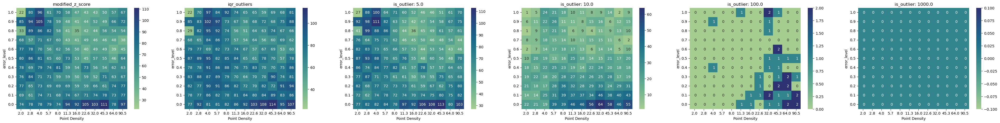


hausdorff_22
---------------------------------------------

modified_z_score: 5914
iqr_outliers: 8229
is_outlier (5.0): 6395
is_outlier (10.0): 918
is_outlier (100.0): 24
is_outlier (1000.0): 0


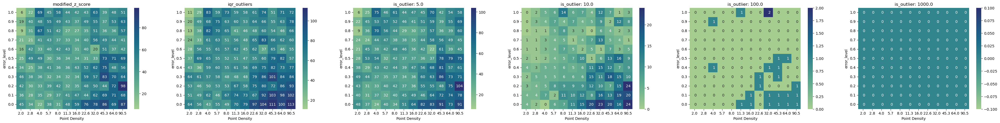


n_faces_22_diff
---------------------------------------------

modified_z_score: 9659
iqr_outliers: 10520
is_outlier (5.0): 10161
is_outlier (10.0): 3433
is_outlier (100.0): 43
is_outlier (1000.0): 0


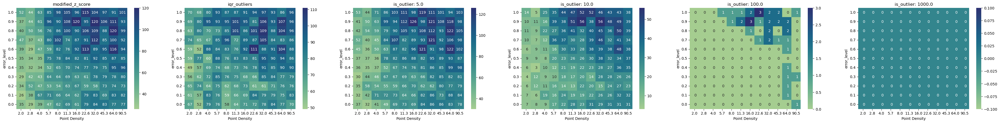


h_70p_diff
---------------------------------------------

modified_z_score: 9892
iqr_outliers: 12398
is_outlier (5.0): 10589
is_outlier (10.0): 2718
is_outlier (100.0): 54
is_outlier (1000.0): 0


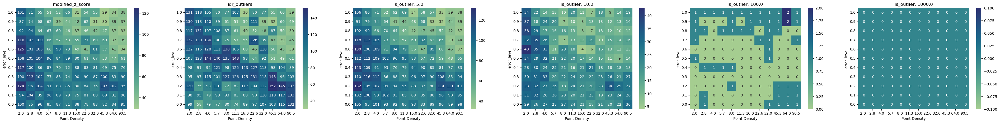


h_max_diff
---------------------------------------------

modified_z_score: 18165
iqr_outliers: 20303
is_outlier (5.0): 18961
is_outlier (10.0): 7999
is_outlier (100.0): 288
is_outlier (1000.0): 52


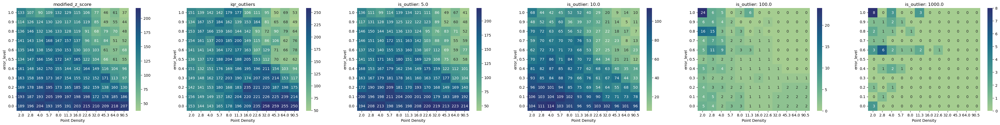

In [24]:
metrics = ["rms_min_dist_22", "hausdorff_22", "n_faces_22_diff", "h_70p_diff", "h_max_diff"]
thresholds = [None, None, .5e1, 1e1, 1e2, 1e3]
outlier_funcs = [modified_z_score, iqr_outliers, is_outlier, is_outlier, is_outlier, is_outlier]

for metric in metrics:
    print(f"\n{metric}")
    print("---------------------------------------------\n")

    n_cols = len(thresholds)
    fig, axs = plt.subplots(1, n_cols, figsize=(8*n_cols, 5))

    for threshold, outlier_func, ax in zip(thresholds, outlier_funcs, axs):
        outliers = outlier_distribution_within_scenarios(metric, threshold, outlier_func=outlier_func)
        print(f"{outlier_func.__name__}{(' (' + str(threshold)) + ')' if threshold is not None else ''}: {outliers.agg('sum').agg('sum')}")

        sns.heatmap(outliers, ax=ax, annot=True, square=True, cmap="crest", fmt="3g")
        ax.tick_params("y", rotation=0)
        ax.set_title(f"{outlier_func.__name__}{(': ' + str(threshold)) if threshold is not None else ''}")

    plt.show()

Check if the above function actually computes the group-wise outliers: (It seems to do so.)

In [208]:
metric = "h_max_abs_diff"
threshold = 1e2
data = results[(results["Point Density"] == 4) & (results["error_level"] == 0.6)][metric].copy()
sum(is_outlier(data, threshold))

9

### Outliers in Building Models

In [ ]:
# Outlier check
outliers = {}
for scenario in e[:121]:
    o = OBJFile(scenario.obj_output_lod22_filepath)
    outliers[scenario.name] = o.has_outlier_vertices()
    print(f"{scenario.name}: {outliers[scenario.name]}")
print(json.dumps(outliers, indent=2))

In [5]:
o = OBJFile(e[112].obj_output_lod22_filepath)
o.has_outlier_vertices()

False

# Dataset-level Evaluation

## Actual Point Density

In [153]:
sns.set_theme(style="whitegrid")

In [154]:
sns.set_context("paper")

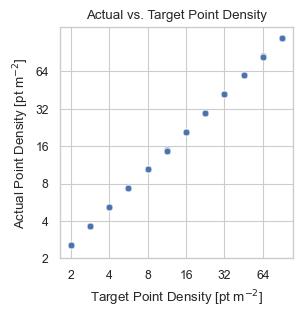

In [155]:
fig, ax = plt.subplots(figsize=(3, 3))
ax = sns.scatterplot(e.summary_stats, x="target_density", y="density_overall")

ax.set_xscale("log")
ax.set_xticks([2**i for i in range(1, 7)])
ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

ax.set_yscale("log")
ax.set_yticks([2**i for i in range(1, 7)])
ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

ax.set_xlabel("Target Point Density [pt m$^{-2}$]")
ax.set_ylabel("Actual Point Density [pt m$^{-2}$]")
ax.set_title("Actual vs. Target Point Density")

plt.show()

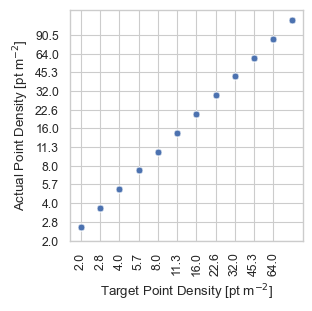

In [156]:
fig, ax = plt.subplots(figsize=(3, 3))
ax = sns.scatterplot(e.summary_stats, x="target_density", y="density_overall")

ax.set_xscale("log")
ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
ax.set_xticks([2**(i/2) for i in range(2, 13)], [f"{v:.1f}" for v in [2**(i/2) for i in range(2, 13)]])
ax.tick_params(axis="x", rotation=90)

ax.set_yscale("log")
ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
ax.set_yticks([2**(i/2) for i in range(2, 14)], [f"{v:.1f}" for v in [2**(i/2) for i in range(2, 14)]])

ax.set_xlabel("Target Point Density [pt m$^{-2}$]")
ax.set_ylabel("Actual Point Density [pt m$^{-2}$]")

plt.show()

In [160]:
e.summary_stats[["target_density", "density_overall"]][e.summary_stats["error_level"] == 0]

,target_density,density_overall
scenario,,
scenario_000,2.000000,2.580942
scenario_011,2.828427,3.663258
scenario_022,4.000000,5.193708
scenario_033,5.656854,7.352528
scenario_044,8.000000,10.419631
scenario_055,11.313708,14.767558
scenario_066,16.000000,20.932800
scenario_077,22.627417,29.622039
scenario_088,32.000000,41.984503


In [161]:
e.summary_stats[["Point Density", "density_overall"]].groupby("Point Density").agg(["mean", "std"])

density_overall          
                         mean       std
Point Density                          
2.0                  2.580983  0.000479
2.8                  3.663094  0.000723
4.0                  5.191553  0.001613
5.7                  7.350492  0.001755
8.0                 10.417714  0.002424
11.3                14.763462  0.004029
16.0                20.927942  0.005083
22.6                29.616643  0.006777
32.0                41.974221  0.010392
45.3                59.471488  0.015110
64.0                84.329877  0.020395
90.5               119.510755  0.029496

## Number of Buildings

<Axes: xlabel='Point Density', ylabel='gpkg_unique_22'>

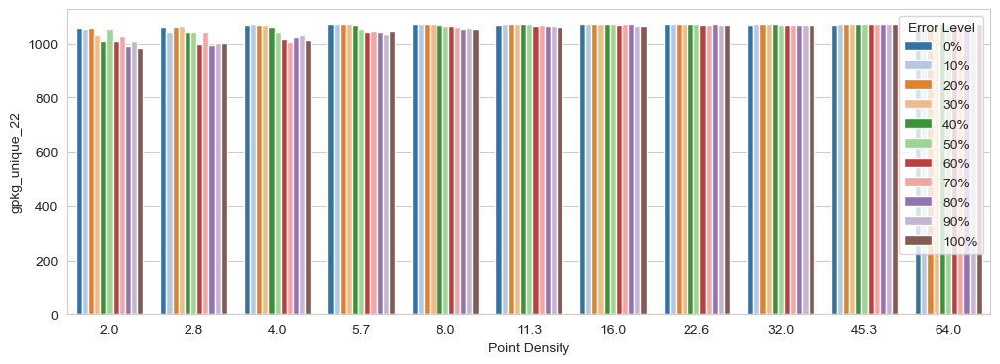

In [123]:
fig, ax = plt.subplots(figsize=(12, 4))
sns.barplot(e.summary_stats, ax=ax, x="Point Density", y="gpkg_unique_22", hue="Error Level", palette="tab20")

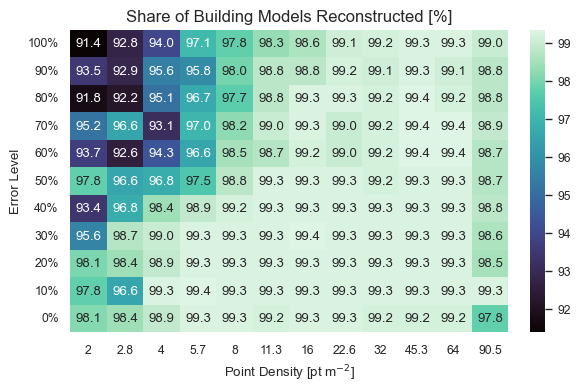

In [64]:
sns.set_theme(style="white", context="paper")

width, height = 5.5, 3.5
width, height = 5.7, 3.8
cmap = "mako"

fig, ax = plt.subplots(figsize=(width, height), layout="constrained")
ax = heatmap("gpkg_unique_22", normalize_to=10.79, annot=True, cmap=cmap, fmt="2.1f", square=False)#, fmt="4g"
ax.set_title("Share of Building Models Reconstructed [%]", fontsize=12)

plt.savefig(f"figures/share_buildings_reconstructed_{width}x{height}_{cmap}.png", dpi=300, bbox_inches="tight")

plt.show()

# Plots for Thesis

## Line Plots

In [40]:
def get_log_ticks_between(min_value, min_power, max_value, max_power):
    ticks =  np.concatenate(
        [np.arange(1 if power != min_power else min_value, 10 if power != max_power else max_value+1) * 10**power for power in range(min_power, max_power+1)]
    )
    decimals = max(0, abs(min_power))
    ticks = [np.round(t, decimals) for t in ticks]
    return ticks

def is_even(val):
    if val >= 1:
        # Traditional even/odd check for integers
        return int(val) % 2 == 0
    
    elif val < 1 and val >= 0:
        # For values < 1, find the most significant non-zero digit
        if val == 0:
            return True  # 0 is even by definition
        
        # Scale the number up to extract the most significant digit
        scaled_val = val * (10 ** (-np.floor(np.log10(val))))
        most_significant_digit = int(scaled_val)

        # Return True if the most significant digit is even, False otherwise
        return most_significant_digit % 2 == 0

def get_even_log_ticklabels(ticks):
    return [str(t) if is_even(t) or t in [10**i for i in range(-20, 20)] else "" for t in ticks]

In [41]:
get_even_log_ticklabels(get_log_ticks_between(5, -2, 10, -1))

['',
 '0.06',
 '',
 '0.08',
 '',
 '0.1',
 '0.2',
 '',
 '0.4',
 '',
 '0.6',
 '',
 '0.8',
 '',
 '1.0']

In [49]:
def lineplot_thesis(
    metric_name: str,
    metric_title: str,
    estimator_name: str,
    metric_unit: str,
    lods: list[str],
    metric_colname_pattern: str,
    subplots_y_log: bool,
    legend_on_plot: int | bool = -1,
    legend_ncols: int | None = None,
    show_xticklabels: bool = True,
    show_xlabel: bool = True,
    errorbars_dict: dict = None,
    outlier_func: Callable | None = None,
    palette = "husl",
    savefig: bool = False
):
    style = "white"
    context = "paper"
    grid = True

    constrained_layout = True
    sharey = True
    sharex = False
    if legend_ncols is None:
        legend_ncols = 3 if subplots_y_log else 2

    col_width = 3
    row_height = 3.5
    if len(lods) == 1:
        col_width = col_width * 1.15

    lods_short = {"1.2": "12", "1.3": "13", "2.2": "22"}

    metric_colnames = [metric_colname_pattern.replace("LOD", lods_short[lod]) for lod in lods] # ["rms_min_dist_12", "rms_min_dist_13", "rms_min_dist_22"]
    y_label = f"{metric_name}" #{(metric_unit != "") * ' [' + metric_unit + ']'}"
    if metric_unit != "":
        y_label += f" [{metric_unit}]"
    x_label = "Point Density [pt m$^{-2}$]"
    titles = [f"{estimator_name} {metric_title} (LOD {lod})" for lod in lods]

    y_log_settings = [False, False, False]
    y_ticks_settings = [None, None, None]

    estimator = estimator_name.lower()
    
    if errorbars_dict is None:
        errorbars_dict = {"mean": ("sd", 0.05), "median": ("pi", 10)}
    errorbar = errorbars_dict[estimator]

    nrows = 1
    ncols = len(metric_colnames)

    sns.set_theme(style=style, context=context)
    fig, axs = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(ncols*col_width, nrows*row_height),
        sharex=sharex,
        sharey=sharey,
        constrained_layout=constrained_layout
    )

    try:
        axs[0]
    except TypeError:
        axs = [axs]

    for ax, metric_colname, title, y_log, y_ticks in zip(axs, metric_colnames, titles, y_log_settings, y_ticks_settings):
        legend = legend_on_plot if isinstance(legend_on_plot, bool) else ax == axs[legend_on_plot]
        ax = lineplot(
            results,
            metric_colname,
            ax=ax,
            y_log=y_log,
            y_ticks=y_ticks,
            legend=legend,
            legend_ncols=legend_ncols,
            grid=grid,
            outlier_func=outlier_func,
            estimator=estimator,
            errorbar=errorbar,
            palette=palette
        )
        ax.set_title(title)
        if show_xlabel:
            ax.set_xlabel(x_label)
        else:
            ax.set_xlabel(None)
        if not show_xticklabels:
            ax.set_xticklabels([])

    axs[0].set_ylabel(y_label)

    if subplots_y_log:
        yticks_dict = {
            "RMS Minimum Distance": {
                "mean": get_log_ticks_between(6, -2, 10, -1),  # [i/100 for i in range(5, 10)] + [i/10 for i in range(1, 11)],
                "median": get_log_ticks_between(3, -2, 8, -1),  # [i/100 for i in range(3, 10)] + [i/10 for i in range(1, 9)]
            },
            "Model Complexity Ratio": {
                "mean": get_log_ticks_between(7, -1, 14, 0),  # [i/10 for i in range(7, 10)] + list(range(1, 10)) + [10, 11, 12, 13, 14],
                "median": get_log_ticks_between(6, -1, 12, 0)  # [i/10 for i in range(6, 10)] + list(range(1, 10)) + [10, 11, 12]
            },
            "Hausdorff Distance": {
                "mean": get_log_ticks_between(3, -1, 5, 0),
                "median": get_log_ticks_between(6, -2, 4, 0)
            }
        }

        # yticklabels_dict = copy.deepcopy(yticks_dict)
        # yticklabels_dict.update({
        #     # "RMS Minimum Distance": {
        #     #     "mean": get_even_log_ticklabels(get_log_ticks_between(5, -2, 10, -1)),
        #     #     "median": [i/100 for i in range(3, 10)] + [i/10 for i in range(1, 9)]
        #     # },
        #     "Building Model Complexity Ratio": {
        #         "mean": [str(i/10) for i in range(7, 10)] + [str(i) for i in range(1, 10)] + ["10", "", "12", "", "14"],
        #         "median": [str(i/10) for i in range(6, 10)] + [str(i) for i in range(1, 10)] + ["10", "", "12"]
        #     }
        # })
        # yticklabels = yticklabels_dict[metric_title][estimator]

        yticks = yticks_dict[metric_title][estimator]
        yticklabels = get_even_log_ticklabels(yticks)

        axs[0].set_yscale("log")

        axs[0].set_yticks(yticks)
        axs[0].yaxis.set_major_formatter(matplotlib.ticker.FixedFormatter(yticklabels))
        # axs[0].get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    
    if savefig:
        filename = metric_title.replace(" ", "_") + "_" + estimator_name + "_log" * subplots_y_log + ".png"
        filename = filename.lower()

        fig.savefig("figures/" + filename, dpi=300, bbox_inches="tight")

    return fig, axs


### RMS Minimum Distance

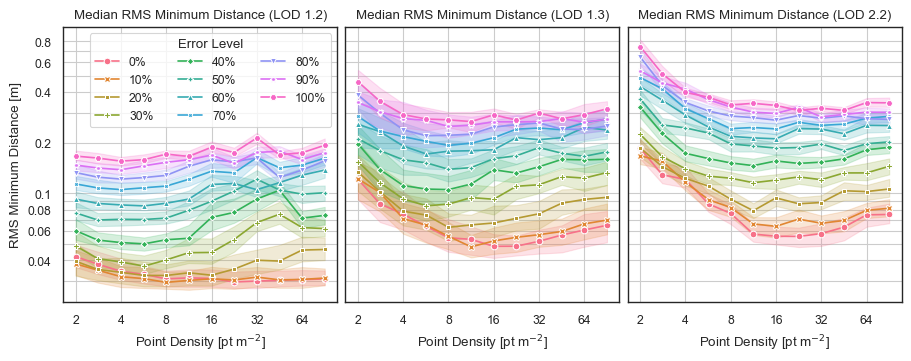

In [113]:
metric_name = "RMS Minimum Distance"
metric_title = metric_name
estimator_name = "Median"
metric_unit = "m"
lods = ["1.2", "1.3", "2.2"]
metric_colname_pattern = "rms_min_dist_LOD"
subplots_y_log = True

fig, axs = lineplot_thesis(
    metric_name=metric_name,
    metric_title=metric_title,
    estimator_name=estimator_name,
    metric_unit=metric_unit,
    lods=lods,
    metric_colname_pattern=metric_colname_pattern,
    subplots_y_log=subplots_y_log,
    legend_on_plot=0,
    savefig=False
)


### Hausdorff Distance

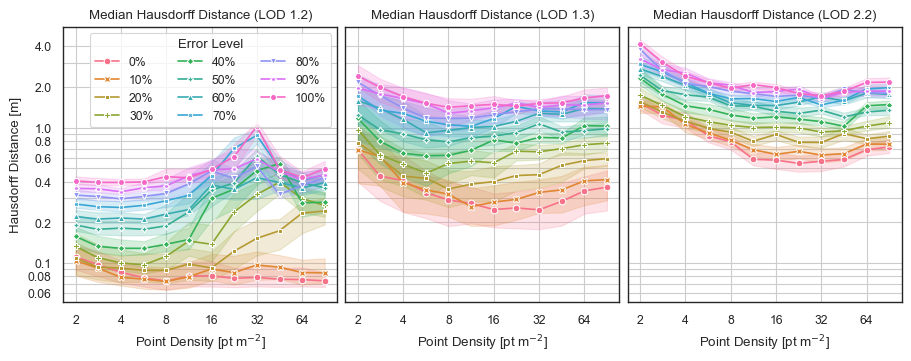

In [149]:
metric_name = "Hausdorff Distance"
metric_title = metric_name
estimator_name = "Median"
metric_unit = "m"
lods = ["1.2", "1.3", "2.2"]
metric_colname_pattern = "hausdorff_LOD"
subplots_y_log = True

fig, axs = lineplot_thesis(
    metric_name=metric_name,
    metric_title=metric_title,
    estimator_name=estimator_name,
    metric_unit=metric_unit,
    lods=lods,
    metric_colname_pattern=metric_colname_pattern,
    subplots_y_log=subplots_y_log,
    legend_on_plot=0,
    savefig=True
)

### Complexity Ratio

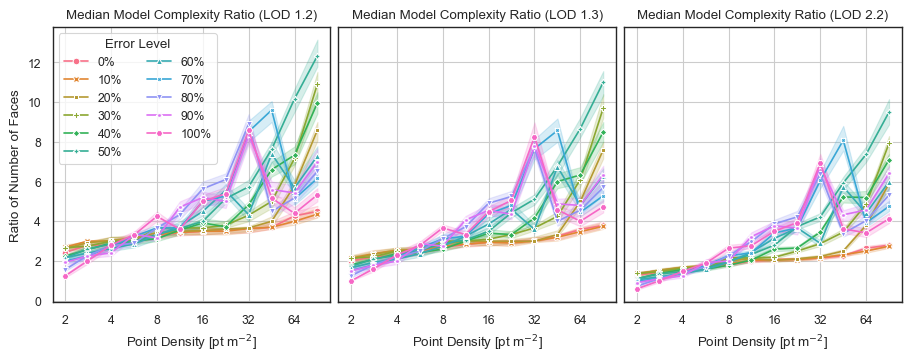

In [136]:
metric_name = "Ratio of Number of Faces"
metric_title = "Model Complexity Ratio"
estimator_name = "Median"
metric_unit = ""
lods = ["1.2", "1.3", "2.2"]
metric_colname_pattern = "n_faces_LOD_ratio"
subplots_y_log = False

fig, axs = lineplot_thesis(
    metric_name=metric_name,
    metric_title=metric_title,
    estimator_name=estimator_name,
    metric_unit=metric_unit,
    lods=lods,
    metric_colname_pattern=metric_colname_pattern,
    subplots_y_log=subplots_y_log,
    legend_on_plot=0,
    legend_ncols=2,
    savefig=True
)

### Height Difference

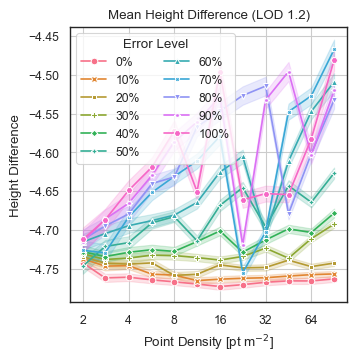

In [157]:
metric_name = "Height Difference"
metric_title = metric_name
estimator_name = "Mean"
metric_unit = ""
lods = ["1.2"]
metric_colname_pattern = "h_50p_diff"
subplots_y_log = False

fig, axs = lineplot_thesis(
    metric_name=metric_name,
    metric_title=metric_title,
    estimator_name=estimator_name,
    metric_unit=metric_unit,
    lods=lods,
    metric_colname_pattern=metric_colname_pattern,
    subplots_y_log=subplots_y_log,
    outlier_func=modified_z_score
    # legend_on_plot=0,
    # legend_ncols=2,
    # savefig=True
)

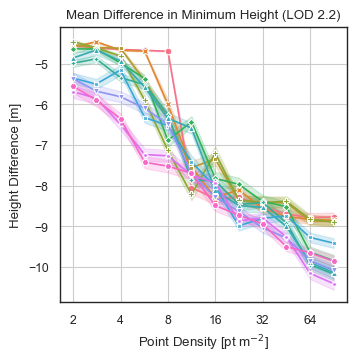

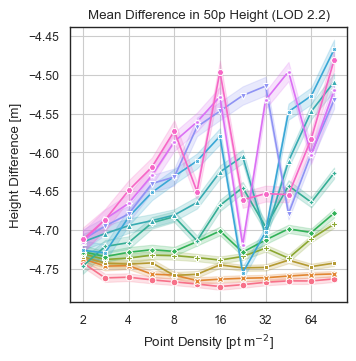

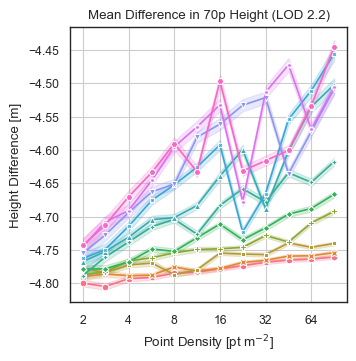

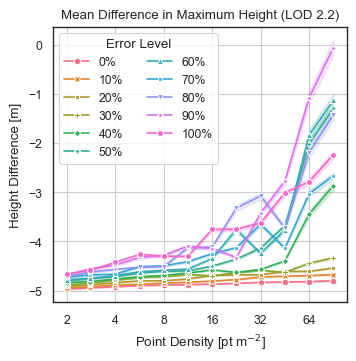

In [58]:
metric_colnames = ["h_min_diff", "h_50p_diff", "h_70p_diff", "h_max_diff"]
legends = [False, False, False, True]
metric_titles = ["Difference in Minimum Height", "Difference in 50p Height", "Difference in 70p Height", "Difference in Maximum Height"]

# fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(3.45*4, 3.5))

for i, metric_colname_pattern in enumerate(metric_colnames):

    metric_name = "Height Difference"
    metric_title = metric_titles[i]
    estimator_name = "Mean"
    metric_unit = "m"
    lods = ["2.2"]
    subplots_y_log = False

    subfig, subaxs = lineplot_thesis(
        metric_name=metric_name,
        metric_title=metric_title,
        estimator_name=estimator_name,
        metric_unit=metric_unit,
        lods=lods,
        metric_colname_pattern=metric_colname_pattern,
        subplots_y_log=subplots_y_log,
        outlier_func=modified_z_score,
        legend_on_plot=legends[i],
        # legend_ncols=2,
        savefig=True
    )

    # axs[i] = subaxs.copy()

# plt.show()

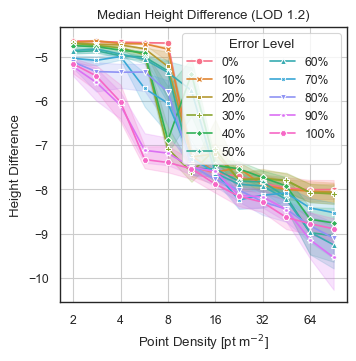

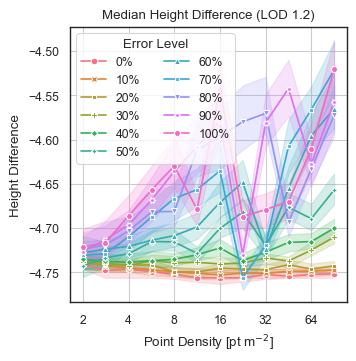

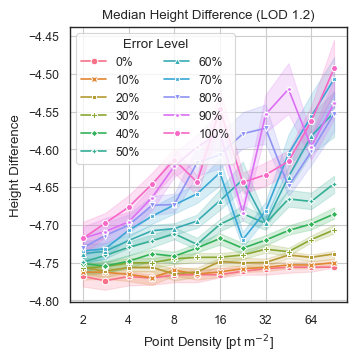

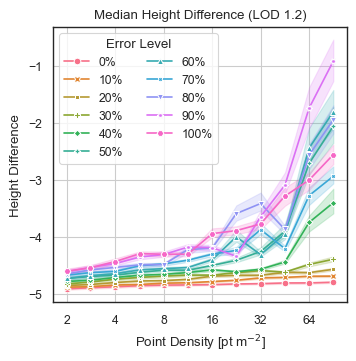

In [45]:
metric_colnames = ["h_min_diff", "h_50p_diff", "h_70p_diff", "h_max_diff"]

# fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(3.45*4, 3.5))

for i, metric_colname_pattern in enumerate(metric_colnames):

    metric_name = "Height Difference"
    metric_title = metric_name
    estimator_name = "Median"
    metric_unit = ""
    lods = ["1.2"]
    subplots_y_log = False

    subfig, subaxs = lineplot_thesis(
        metric_name=metric_name,
        metric_title=metric_title,
        estimator_name=estimator_name,
        metric_unit=metric_unit,
        lods=lods,
        metric_colname_pattern=metric_colname_pattern,
        subplots_y_log=subplots_y_log,
        outlier_func=modified_z_score
        # legend_on_plot=0,
        # legend_ncols=2,
        # savefig=True
    )

    # axs[i] = subaxs.copy()

# plt.show()

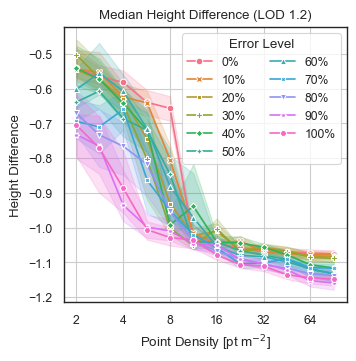

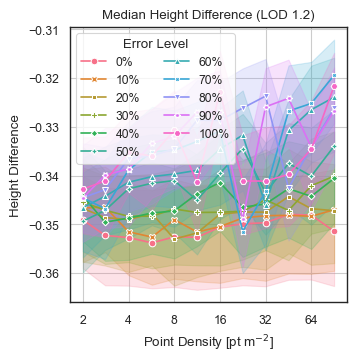

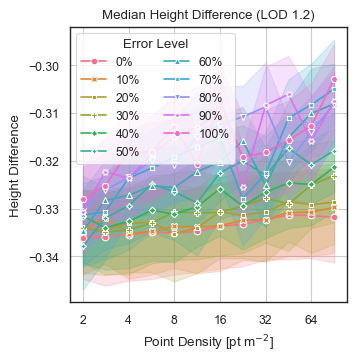

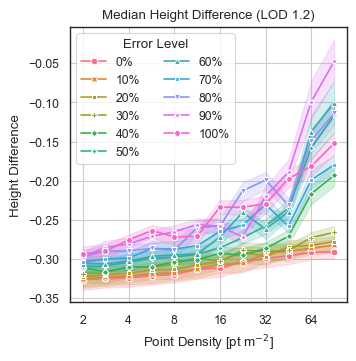

In [167]:
metric_colnames = ["h_min_norm_diff", "h_50p_norm_diff", "h_70p_norm_diff", "h_max_norm_diff"]

# fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(3.45*4, 3.5))

for i, metric_colname_pattern in enumerate(metric_colnames):

    metric_name = "Height Difference"
    metric_title = metric_name
    estimator_name = "Median"
    metric_unit = ""
    lods = ["1.2"]
    subplots_y_log = False

    subfig, subaxs = lineplot_thesis(
        metric_name=metric_name,
        metric_title=metric_title,
        estimator_name=estimator_name,
        metric_unit=metric_unit,
        lods=lods,
        metric_colname_pattern=metric_colname_pattern,
        subplots_y_log=subplots_y_log,
        outlier_func=modified_z_score
        # legend_on_plot=0,
        # legend_ncols=2,
        # savefig=True
    )

    # axs[i] = subaxs.copy()

# plt.show()

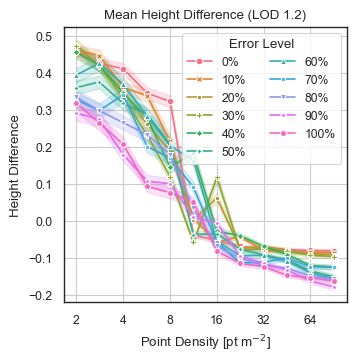

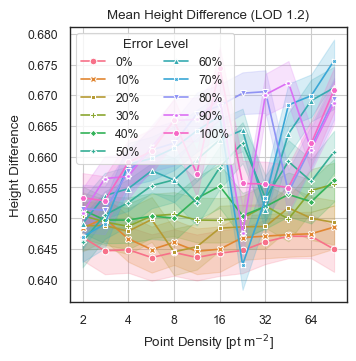

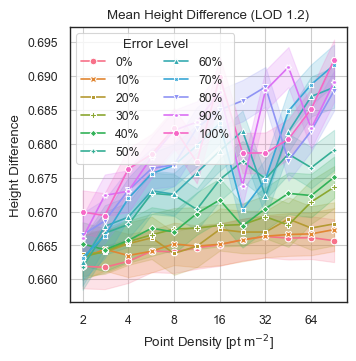

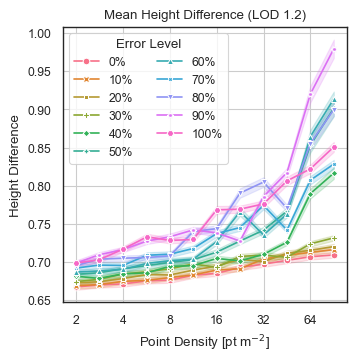

In [164]:
metric_colnames = ["h_min_ratio", "h_50p_ratio", "h_70p_ratio", "h_max_ratio"]

# fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(3.45*4, 3.5))

for i, metric_colname_pattern in enumerate(metric_colnames):

    metric_name = "Height Difference"
    metric_title = metric_name
    estimator_name = "Mean"
    metric_unit = ""
    lods = ["1.2"]
    subplots_y_log = False

    subfig, subaxs = lineplot_thesis(
        metric_name=metric_name,
        metric_title=metric_title,
        estimator_name=estimator_name,
        metric_unit=metric_unit,
        lods=lods,
        metric_colname_pattern=metric_colname_pattern,
        subplots_y_log=subplots_y_log,
        outlier_func=modified_z_score
        # legend_on_plot=0,
        # legend_ncols=2,
        # savefig=True
    )

    # axs[i] = subaxs.copy()

# plt.show()

## KDE Plots

Prepare data: Create a subset of the results table for each metric to be plotted. From the subset, remove outliers in this metric and keep only density and error columns additionally. Then, filter point densities for selected values and rename the metric column of each subset to a neutral name (`metric_value`). Following this, create a new dataframe which will have the metric name from the dictionary key as an additional index.

Perhaps some kind of reshaping from a pivot format into a long format could do the same. However, removing outliers specifically to each metric might be more difficult then.
    

In [92]:
# metrics = ["rms_min_dist_12", "rms_min_dist_22", "n_faces_12_diff", "n_faces_22_diff"]
# metrics = ["hausdorff_12", "hausdorff_22", "n_faces_12_ratio", "n_faces_22_ratio"]

metrics = ["rms_min_dist_12", "rms_min_dist_22", "n_faces_22_ratio"]
densities = [4, 8, 16, 32]

data_subsets = {
    metric: results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score, threshold=3.5)][["Point Density", "Error Level", metric]].copy()
    for metric in metrics
}

for metric, df in data_subsets.items():
    data_subsets[metric] = df[df["Point Density"].isin(densities)]
for metric, df in data_subsets.items():
    data_subsets[metric] = df.rename(columns={metric: "metric_values"})

data = pd.concat(data_subsets)
data.index.names = ["metric", "scenario", "identificatie"]
data.shape

(131911, 3)

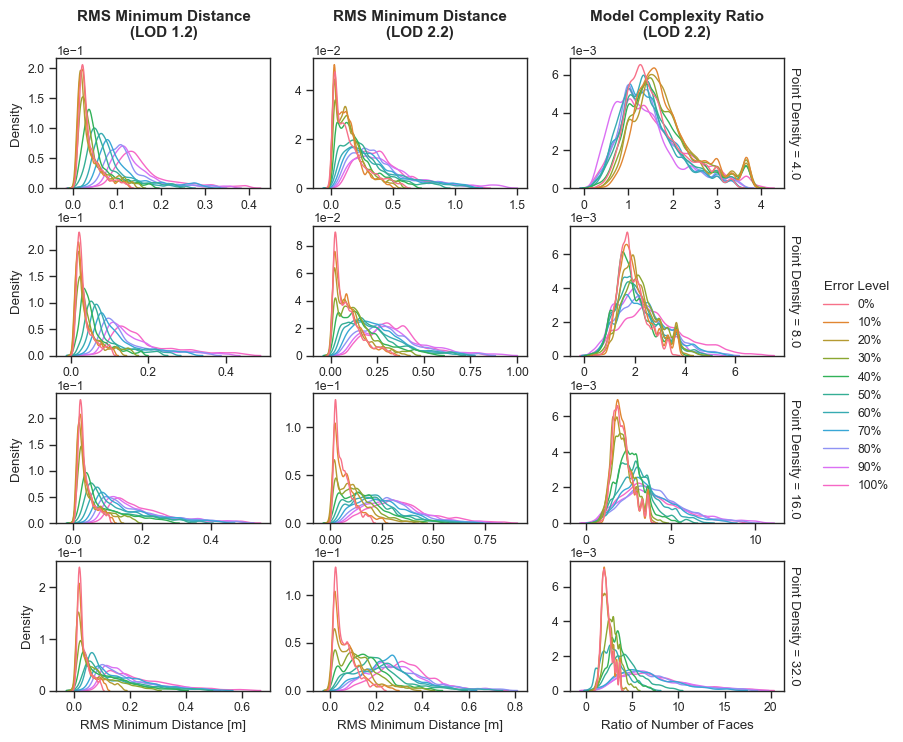

In [96]:
titles = ["RMS Minimum Distance\n(LOD 1.2)", "RMS Minimum Distance\n(LOD 2.2)", "Model Complexity Ratio\n(LOD 2.2)"]
x_labels = ["RMS Minimum Distance [m]"] * 2 + ["Ratio of Number of Faces"]

# original height and aspect were 2 and 1.5

sns.set_theme(style="ticks", context="paper")
g = sns.displot(
    data=data,
    x="metric_values",
    hue="Error Level",
    row="Point Density",
    col="metric",
    kind="kde",
    facet_kws=dict(sharex=False, sharey=False, margin_titles=True, despine=False),
    height=1.8,
    aspect=1.6,
    linewidth=1,
    bw_adjust=.5,
    # cut=0
    # common_norm=False
)

g.figure.subplots_adjust(wspace=0.2)

for _, ax in g.axes_dict.items():
    ax.ticklabel_format(axis='y', style='scientific', scilimits=(-1, 10))
    ax.grid(False)

for c in range(3):
    g.axes[0, c].set_title(titles[c], fontweight="bold", fontsize=11)
    g.axes[len(densities)-1, c].set_xlabel(x_labels[c])

# sns.move_legend(g, "upper center", bbox_to_anchor=(0.5, 0), ncols=4)
sns.move_legend(g, "center right", bbox_to_anchor=(0.97, 0.5), ncols=1)

# g.savefig("figures/metrics_kde_plots_1.8_1.6_wspace0.2_linebreak_ticks.png", dpi=300, bbox_inches="tight")

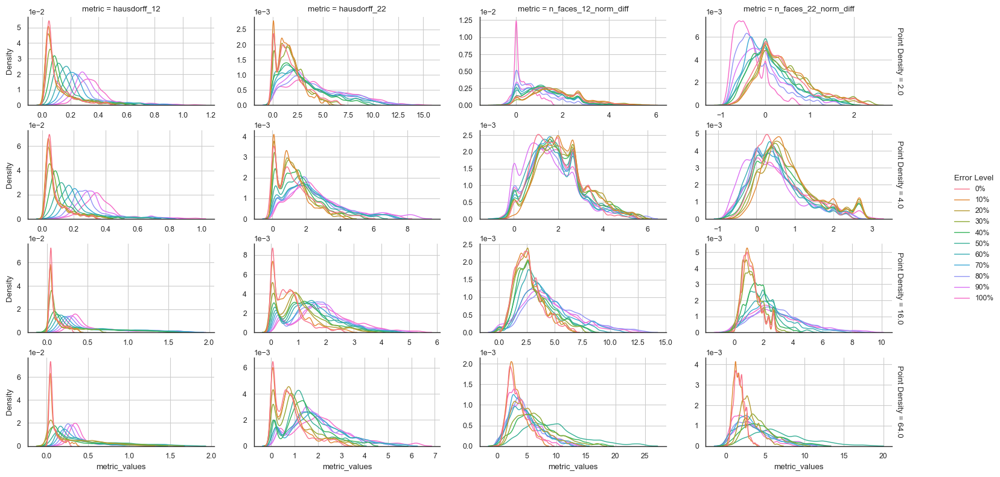

In [ ]:
sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x="metric_values", hue="Error Level", row="Point Density", col="metric", kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False, margin_titles=True), height=2, aspect=2, linewidth=1)

for _, ax in g.axes_dict.items():
    ax.ticklabel_format(axis='y', style='scientific', scilimits=(-1, 10))
    ax.grid(True)


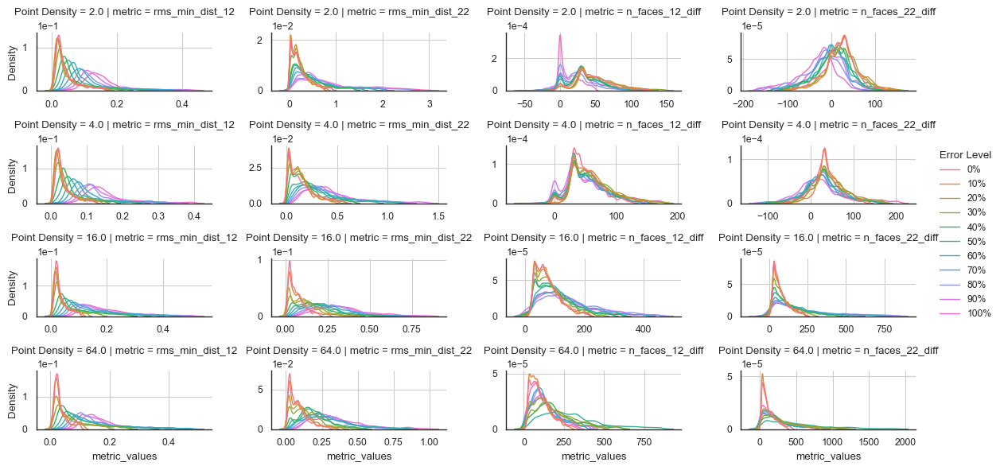

In [ ]:
sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x="metric_values", hue="Error Level", row="Point Density", col="metric", kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=1.5, aspect=2, linewidth=1)

for _, ax in g.axes_dict.items():
    ax.ticklabel_format(axis='y', style='scientific', scilimits=(-1, 10))
    ax.grid(True)


# Geometric Distances

## RMS Min Distance

### Heatmap

<Axes: xlabel='Point Density [pt m$^{-2}$]', ylabel='Error Level'>

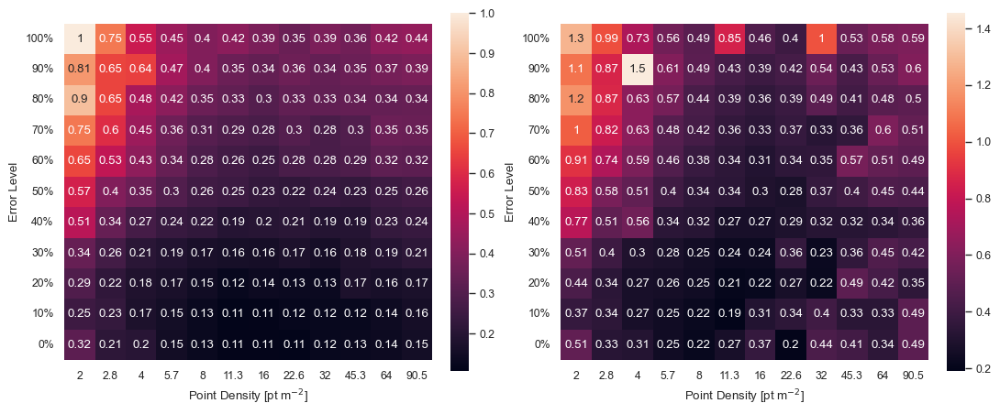

In [125]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10.8, 4.5), constrained_layout=True)
heatmap("rms_min_dist_22_mean", ax=axs[0], annot=True, fmt=".2g")
heatmap("rms_min_dist_22_rms", ax=axs[1], annot=True, fmt=".2g")

### Line Plot

In [126]:
y_ticks = [i/100 for i in range(5, 10)]+[i/10 for i in range(1, 11)]
y_ticklabels = [f"{v:.0E}" for v in y_ticks]
y_ticklabels

['5E-02',
 '6E-02',
 '7E-02',
 '8E-02',
 '9E-02',
 '1E-01',
 '2E-01',
 '3E-01',
 '4E-01',
 '5E-01',
 '6E-01',
 '7E-01',
 '8E-01',
 '9E-01',
 '1E+00']

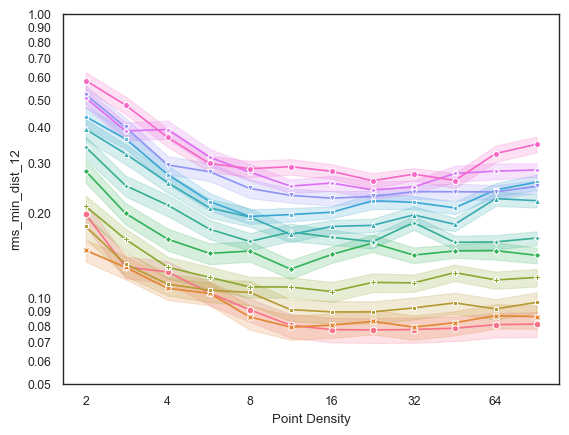

In [127]:
ax = lineplot(results, "rms_min_dist_12", y_log=True, y_ticks=[i/100 for i in range(5, 10)]+[i/10 for i in range(1, 11)], estimator="mean", errorbar=("sd", 0.05), legend=False)
ax.grid()

KeyboardInterrupt: 

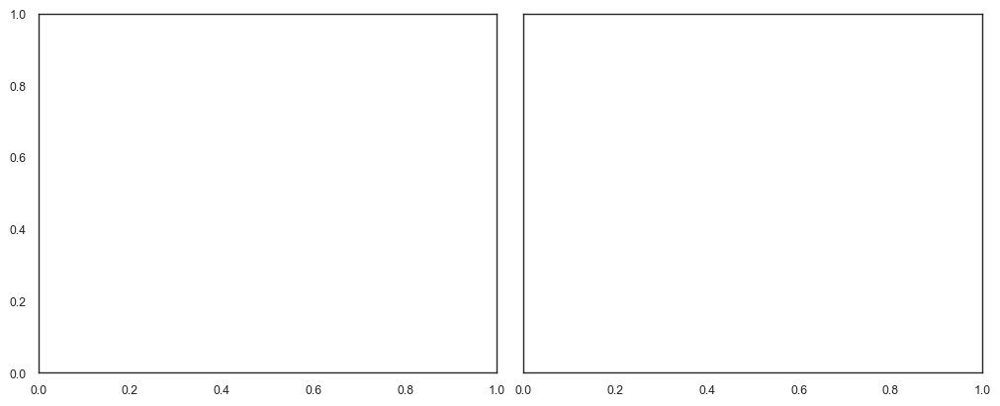

In [128]:
metric = "rms_min_dist_22"

sns.set_theme(style="white", context="paper")
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharey=True, layout="constrained")


colors = ["#e6194b",  # Bright Red
          "#3cb44b",  # Bright Green
          "#ffe119",  # Yellow
          "#4363d8",  # Blue
          "#f58231",  # Orange
          "#911eb4",  # Purple
          "#46f0f0",  # Cyan
          "#f032e6",  # Magenta
          "#bcf60c",  # Lime
          "#fabebe",  # Light Pink
          "#008080"]  # Teal

lineplot(results, metric, ax=axs[0], y_log=True, y_ticks=[i/100 for i in range(5, 10)]+[i/10 for i in range(1, 11)], outlier_func=None, estimator="mean", errorbar=("sd", 0.05), palette="husl")
lineplot(results, metric, ax=axs[1], y_log=True, y_ticks=[i/100 for i in range(5, 10)]+[i/10 for i in range(1, 11)], outlier_func=None, estimator="median", errorbar=("pi", 10), palette="husl")

axs[0].get_legend().remove()
axs[1].legend(ncols=3)

axs[0].set_title("Mean RMS Minimum Distance")
axs[1].set_title("Median RMS Minimum Distance")

for ax in axs:
    ax.grid()
    ax.set_xlabel("Point Density [pt m$^{-2}$]")
    ax.set_ylabel("RMS Minimum Distance")

# fig.savefig("figures/rms_min_dist")

#### Outlier Removal Comparison

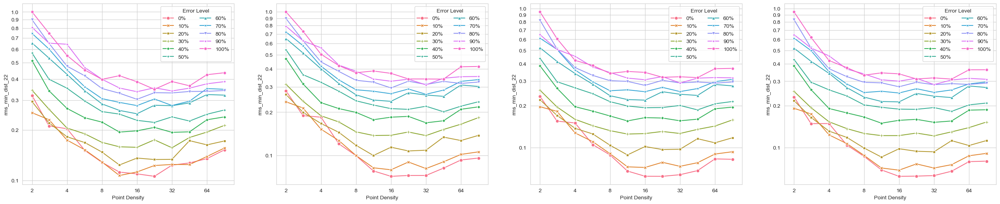

In [235]:
fig, axs = plt.subplots(1, 4, figsize=(32, 6))
for ax, mt, th in zip(axs, [None, is_outlier, modified_z_score, iqr_outliers], [None, 1e1, 3.5, 1.5]):
    lineplot(results, "rms_min_dist_22", ax, y_log=True, y_ticks=[i/10 for i in range(1, 11)], outlier_method="group", outlier_func=mt, outlier_threshold=th, errorbar=None)

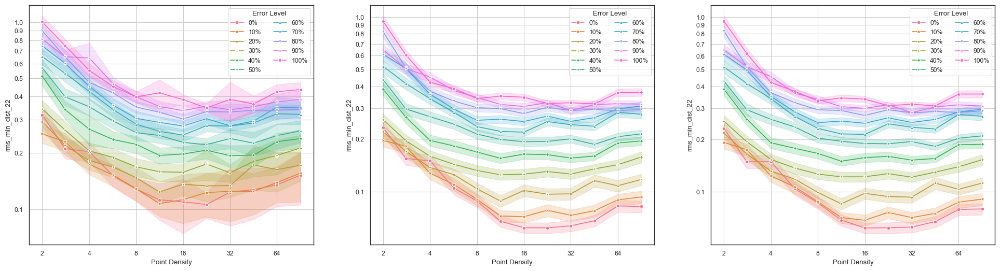

In [45]:
fig, axs = plt.subplots(1, 3, figsize=(24, 6))
for ax, mt, th in zip(axs, [None, modified_z_score, iqr_outliers], [None, 3.5, 1.5]):
    lineplot(results, "rms_min_dist_22", ax=ax, y_log=True, y_ticks=[i/10 for i in range(1, 11)], outlier_func=mt, outlier_threshold=th, errorbar=("sd", 0.1))
    ax.grid()

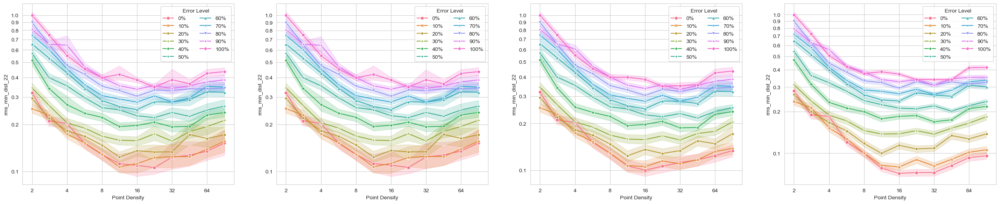

In [162]:
# fig, ax = plt.subplots(figsize=(10, 7))
fig, axs = plt.subplots(1, 4, figsize=(32, 6))
for ax, th in zip(axs, [None, 1e3, 1e2, 1e1]):
    lineplot(results, "rms_min_dist_22", ax, y_log=True, y_ticks=[i/10 for i in range(1, 11)], estimator="mean", outlier_threshold=th, errorbar=("ci"))

#### Initial Line Plots

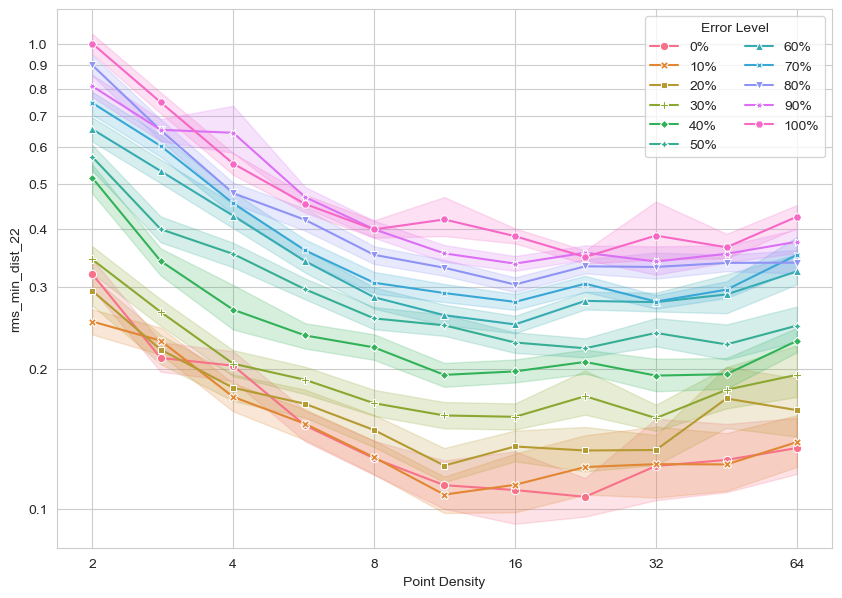

In [134]:
# sns.lineplot(ax=ax, data=results[results["Error Level"] == "0%"], x="Point Density", y="rms_min_dist_22")
# sns.lineplot(ax=ax, data=results[results["Error Level"] == "0%"], x="Point Density", y="rms_min_dist_22", hue="Error Level", units="identificatie", estimator=None, lw=1)

fig, ax = plt.subplots(figsize=(10, 7))

data=results#[results["Error Level"] == "100%"]
sns.lineplot(ax=ax, data=data, x="Point Density", y="rms_min_dist_22", hue="Error Level", style="Error Level", markers=True, dashes=False, err_style="band", estimator="mean") #, estimator="median", errorbar=("pi", 10))
plt.legend(ncols=2, title="Error Level")

ax.set_xscale("log")
ax.set_xticks([2**i for i in range(1, 7)])
ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

ax.set_yscale("log")
ax.set_yticks([i/10 for i in range(1, 11)])
ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

# ax.set_ylim(bottom=0)

(0.0, 1.0452106761364175)

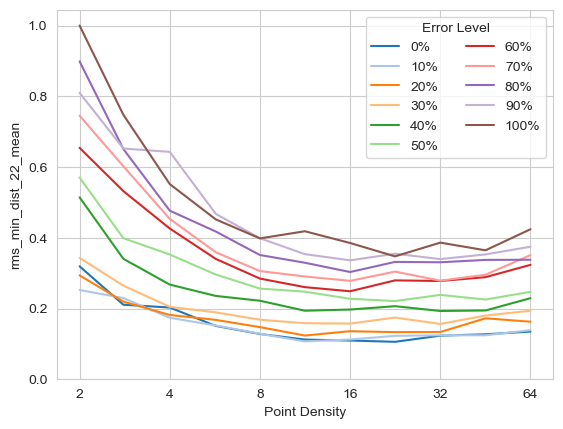

In [29]:
ax = sns.lineplot(e.summary_stats, x="Point Density", y="rms_min_dist_22_mean", hue="Error Level", palette="tab20")
plt.legend(ncols=2, title="Error Level")

ax.set_xscale("log")
ax.set_xticks([2**i for i in range(1, 7)])
ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

ax.set_ylim(bottom=0)

### Distributions by Scenarios

In [51]:
data = results[~is_outlier_by_group(results, "rms_min_dist_22", outlier_func=modified_z_score)]

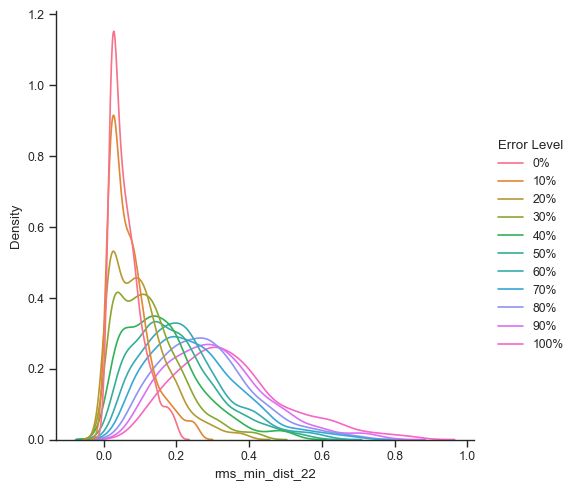

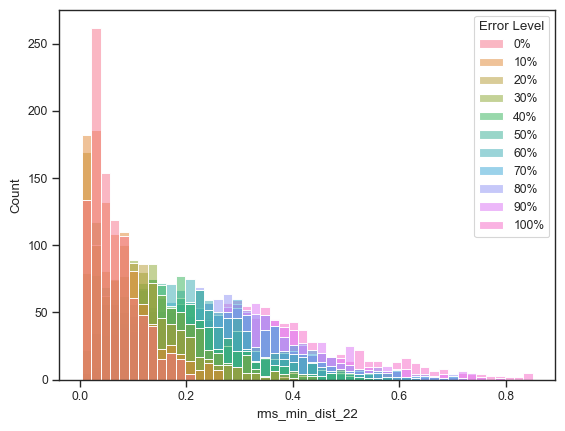

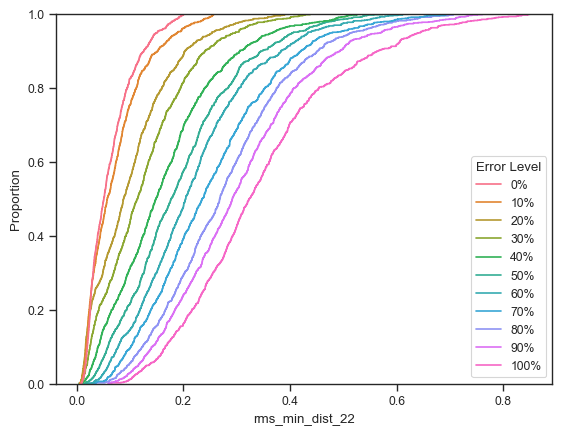

In [53]:
sns.displot(data=data[data["Point Density"] == 16], x="rms_min_dist_22", hue="Error Level", kind="kde")#, kind="hist", multiple="dodge", height=3, aspect=5)
plt.show()
sns.histplot(data=data[data["Point Density"] == 16], x="rms_min_dist_22", hue="Error Level", fill=True)
plt.show()
sns.ecdfplot(data=data[data["Point Density"] == 16], x="rms_min_dist_22", hue="Error Level")
plt.show()

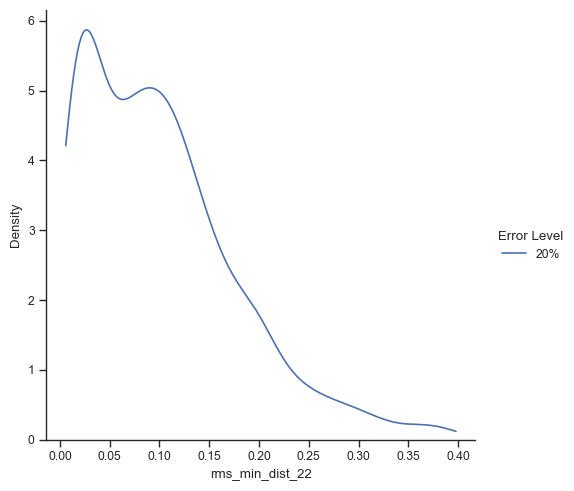

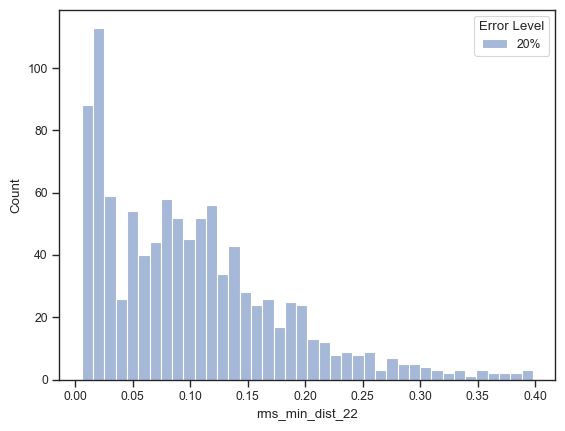

In [46]:
sns.displot(data=data[(data["Point Density"] == 16) & (data["Error Level"] == "20%")], x="rms_min_dist_22", hue="Error Level", kind="kde", cut=0)#, kind="hist", multiple="dodge", height=3, aspect=5)
plt.show()
sns.histplot(data=data[(data["Point Density"] == 16) & (data["Error Level"] == "20%")], x="rms_min_dist_22", hue="Error Level", fill=True, bins=40)
plt.show()

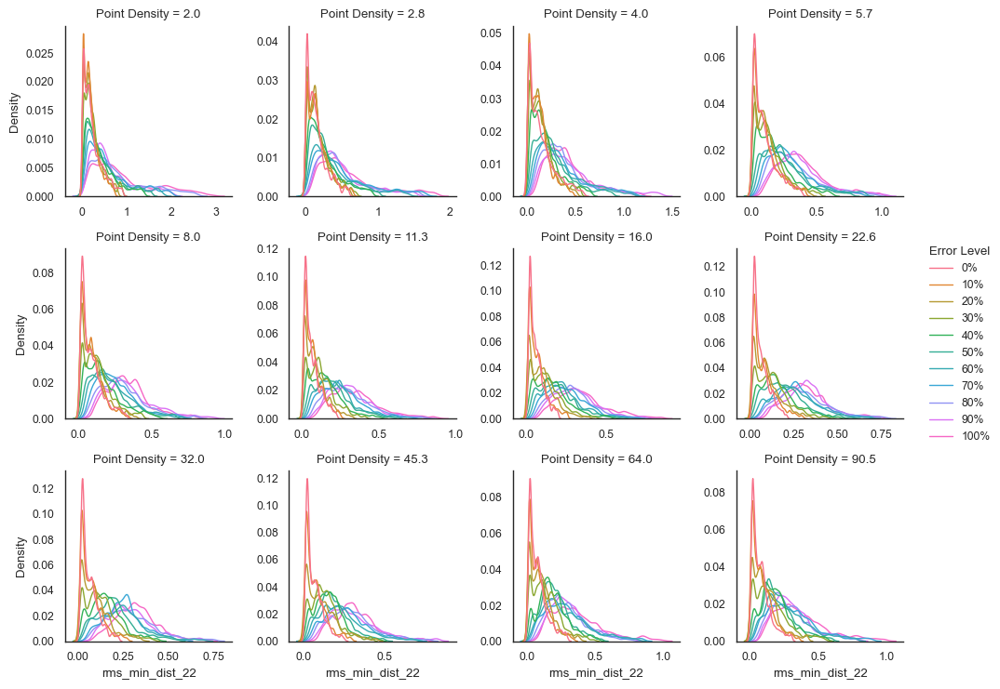

In [219]:
metric = "rms_min_dist_22"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density", col_wrap=4, kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=2.5, aspect=1, linewidth=1)

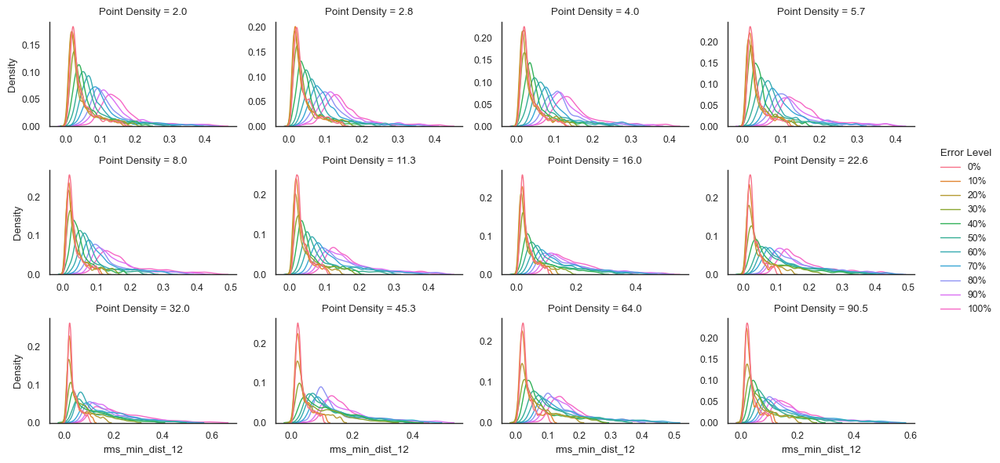

In [218]:
metric = "rms_min_dist_12"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density", col_wrap=4, kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=2, aspect=1.5, linewidth=1)

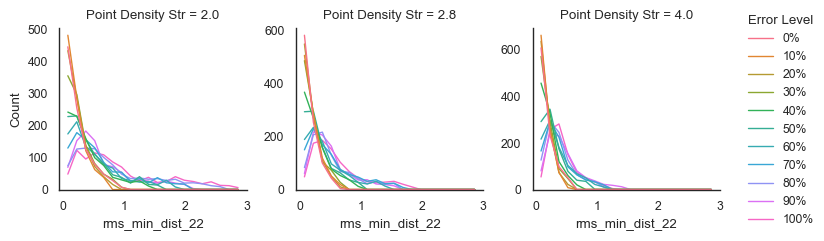

In [199]:
metric = "rms_min_dist_22"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]
data = data[data["target_density"] <= 4]

# element="step" or "poly" are useful, but not good enough

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density Str", kind="hist", bins=20, fill=False, element="poly", facet_kws=dict(sharex=False, sharey=False), height=2.5, aspect=1, linewidth=1)

### Distributions by Groups

#### Check Distribution of Continuous Variables

In [100]:
variable = "oorspronkelijkbouwjaar"

density = 8
error = 0.3

categorical_variables = ["gebruiksdoel"]

if variable in categorical_variables:
    cut = True
    qcut = False
    colname_cut = variable

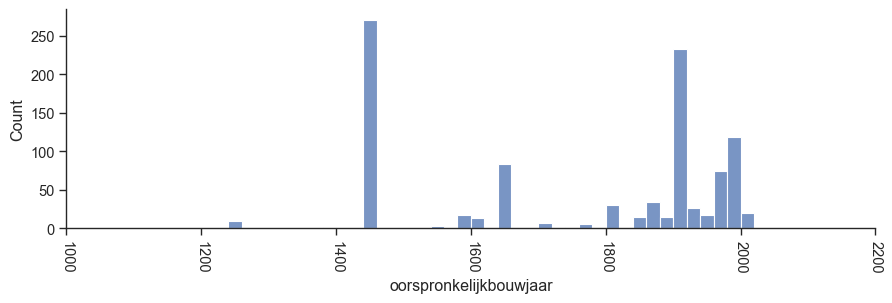

In [101]:
# The distributions of the variables should be almost identical between the different scenarios.
# Nevertheless, it is plotted for a single scenario because otherwise every building would be
# counted multiple times.

def get_kwargs(variable: str) -> dict:
    if variable == "oorspronkelijkbouwjaar":
        return dict(height=3, aspect=3, bins=np.arange(1200, 2021, 20))
    elif variable in ["vol_est", "b3_volume_lod22"]:
        return dict(facet_kws=dict(xlim=(0, 10000)))
    return {}

data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]
if variable == "gebruiksdoel":
    data = data.reset_index()
g = sns.displot(data[(data["Point Density"] == density) & (data["error_level"] == error)], x=variable, kind="hist", **get_kwargs(variable))
g.set_xticklabels(rotation=270)

#### Discretize Continuous Variables into Groups

In [102]:
cut = True
qcut = True

vars_to_discretize = ["n_faces_22", "h_70p_in", "n_faces_22_in", "b3_opp_grond", "vol_est", "share_flat_roof", "b3_volume_lod22", "oorspronkelijkbouwjaar"]

for var in vars_to_discretize:

    if cut:
        # Cut bins for n_faces_22
        if var == "n_faces_22":
            cut_bins = list(np.arange(0, 1001, 100)) + [10000]
            cut_labels = [f"≤ {v}" for v in list(np.arange(100, 1001, 100))] + ["> 1000"]

        # Cut bins for h_70p_in
        elif var == "h_70p_in":
            cut_bins = list(np.arange(0, 21, 2)) + [200]
            cut_labels = [f"≤ {v}" for v in list(np.arange(2, 21, 2))] + ["> 20"]

        # Cut bins for n_faces_22_in
        elif var == "n_faces_22_in":
            # cut_bins = list(np.arange(0, 401, 40)) + [4000]
            # cut_labels = [f"≤ {v}" for v in list(np.arange(40, 401, 40))] + ["> 400"]
            cut_bins = list(np.arange(0, 201, 25)) + [4000]
            cut_labels = [f"≤ {v}" for v in list(np.arange(25, 201, 25))] + ["> 200"]

        elif var == "b3_opp_grond":
            cut_bins = list(np.arange(0, 401, 40)) + [4000]
            cut_labels = [f"≤ {v}" for v in list(np.arange(40, 401, 40))] + ["> 400"]

        elif var == "vol_est":
            cut_bins = list(np.arange(0, 6001, 600)) + [100000]
            cut_labels = [f"≤ {v}" for v in list(np.arange(600, 6001, 600))] + ["> 6000"]

        elif var == "share_flat_roof":
            cut_bins = [-1] + list(np.arange(0, 0.81, 0.2)) + [0.999999999, 2]
            cut_labels = ["= 0"] + [f"≤ {np.round(v, 1)}" for v in list(np.arange(0.2, 0.81, 0.2))] + ["< 1", "= 1"]

        elif var == "b3_volume_lod22":
            # cut_bins = list(np.arange(0, 4001, 400)) + [60000]
            # cut_labels = [f"≤ {v}" for v in list(np.arange(400, 4001, 400))] + ["> 4000"]
            cut_bins = list(np.arange(0, 2001, 250)) + [60000]
            cut_labels = [f"≤ {v}" for v in list(np.arange(250, 2001, 250))] + ["> 2000"]
        
        elif var == "oorspronkelijkbouwjaar":
            # cut_bins = [0] + list(np.arange(1500, 1900, 100)) + list(np.arange(1900, 2021, 20))
            # cut_labels = ["≤ 1500"] + [f"≤ {v}" for v in list(np.arange(1600, 1900, 100))] + [f"≤ {v}" for v in list(np.arange(1900, 2021, 20))]
            # cut_bins = [0] + list(np.arange(1500, 1900, 100)) + list(np.arange(1900, 2051, 50))
            # cut_labels = ["≤ 1500"] + [f"≤ {v}" for v in list(np.arange(1600, 1900, 100))] + [f"≤ {v}" for v in list(np.arange(1900, 2001, 50))] + ["> 2000"]
            cut_bins = [0] + list(np.arange(1500, 1900, 100)) + list(np.arange(1900, 1951, 50)) + [3000]
            cut_labels = ["≤ 1500"] + [f"≤ {v}" for v in list(np.arange(1600, 1900, 100))] + [f"≤ {v}" for v in list(np.arange(1900, 1951, 50))] + ["> 1950"]

        print(var, cut_bins, cut_labels)
        colname_cut = f"{var}_cut"
        results[colname_cut] = pd.cut(results[var], bins=cut_bins, labels=cut_labels)

    if qcut:
        qcut_quantiles = 10
        colname_qcut = f"{var}_qcut"
        
        results[colname_qcut] = pd.qcut(results[var], q=10, duplicates="drop")
        results[colname_qcut] = results[colname_qcut].apply(lambda x: str(x) if x is not pd.NA else pd.NA)

n_faces_22 [0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 10000] ['≤ 100', '≤ 200', '≤ 300', '≤ 400', '≤ 500', '≤ 600', '≤ 700', '≤ 800', '≤ 900', '≤ 1000', '> 1000']
h_70p_in [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 200] ['≤ 2', '≤ 4', '≤ 6', '≤ 8', '≤ 10', '≤ 12', '≤ 14', '≤ 16', '≤ 18', '≤ 20', '> 20']
n_faces_22_in [0, 25, 50, 75, 100, 125, 150, 175, 200, 4000] ['≤ 25', '≤ 50', '≤ 75', '≤ 100', '≤ 125', '≤ 150', '≤ 175', '≤ 200', '> 200']
b3_opp_grond [0, 40, 80, 120, 160, 200, 240, 280, 320, 360, 400, 4000] ['≤ 40', '≤ 80', '≤ 120', '≤ 160', '≤ 200', '≤ 240', '≤ 280', '≤ 320', '≤ 360', '≤ 400', '> 400']
vol_est [0, 600, 1200, 1800, 2400, 3000, 3600, 4200, 4800, 5400, 6000, 100000] ['≤ 600', '≤ 1200', '≤ 1800', '≤ 2400', '≤ 3000', '≤ 3600', '≤ 4200', '≤ 4800', '≤ 5400', '≤ 6000', '> 6000']
share_flat_roof [-1, 0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 0.999999999, 2] ['= 0', '≤ 0.2', '≤ 0.4', '≤ 0.6', '≤ 0.8', '< 1', '= 1']
b3_volume_lod22 [0, 250, 500, 750, 1000, 1250, 1500, 

In [103]:
def vary_linestyles(g):
    """
    Changes the line styles in each semeantig group in a Seaborn KDE plot
    
    Adapted from https://stackoverflow.com/a/70089200
    """
    lss = [':', '-.', '--', (0, (3, 1, 1, 1, 1, 1))]
    n_lss = len(lss)
    
    axes = g.axes.flat
    
    for ax in axes:
        for i, line in enumerate(ax.lines):
            line.set_linestyle(lss[i % n_lss])
    
    handles = g._legend.legend_handles[::-1]
    for i, handle in enumerate(handles):
        handle.set_ls(lss[i % n_lss])


#### Multiple KDE Plots

C:\Users\Florian\AppData\Local\Temp\ipykernel_24620\4166323309.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data = results_use[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)].copy()


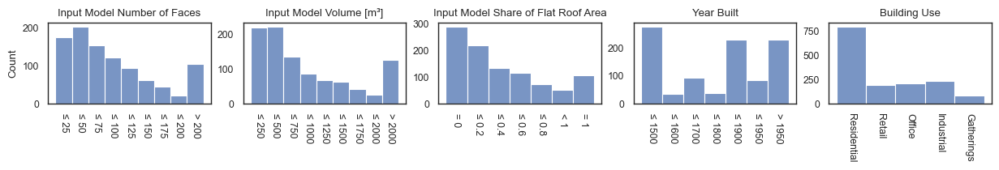

In [158]:
# Check distributions of the groups - are the bins well defined? Does it make sense to include all groups?

sns.set_theme(context="paper", style="white")

metric = "rms_min_dist_22"
densities = [11.3]
errors = [0]

variables = ["n_faces_22_in", "b3_volume_lod22", "share_flat_roof", "oorspronkelijkbouwjaar"]
colnames_cut = [f"{variable}_cut" for variable in variables] + ["gebruiksdoel_en"]
colnames_qcut = [f"{variable}_qcut" for variable in variables]

legend_titles = {
    "n_faces_22_in_cut": "Input Model Number of Faces",
    "b3_volume_lod22_cut": "Input Model Volume [m³]",
    "share_flat_roof_cut": "Input Model Share of Flat Roof Area",
    "oorspronkelijkbouwjaar_cut": "Year Built",
    "gebruiksdoel_en": "Building Use"
}

multiple = "stack"

for error in errors:
    
    data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)].copy()
    data = data[(data["Point Density"].isin(densities)) & (data["error_level"].isin([error]))]

    fig, axs = plt.subplots(nrows=1, ncols=len(colnames_cut), figsize=(15, 1.3))

    for i, hue_colname in enumerate(colnames_cut):
        if i == len(colnames_cut) - 1:
            data = results_use[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)].copy()
            data = data[(data["Point Density"].isin(densities)) & (data["error_level"].isin([error]))]

            gebruiksdoel_min_50 = ["woonfunctie", "industriefunctie", "kantoorfunctie", "winkelfunctie", "bijeenkomstfunctie"]
            data = data[data.gebruiksdoel_nl.isin(gebruiksdoel_min_50)]
            data = data.sort_values(by=["gebruiksdoel_nl", "error_level"], ascending=False)#.sort_values(by="error_level")

        sns.histplot(
            data,
            x=hue_colname,
            ax=axs[i]
        )
        axs[i].tick_params(axis="x", rotation=270)
        axs[i].set_xlabel("")
        if i > 0:
            axs[i].set_ylabel("")
        axs[i].set_title(legend_titles[hue_colname])
    
    plt.show()


##### Groups of Continuous Variables

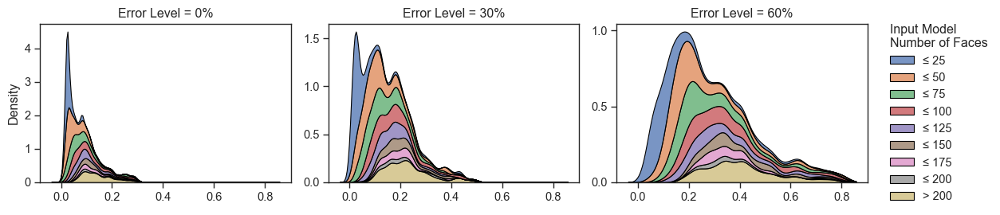

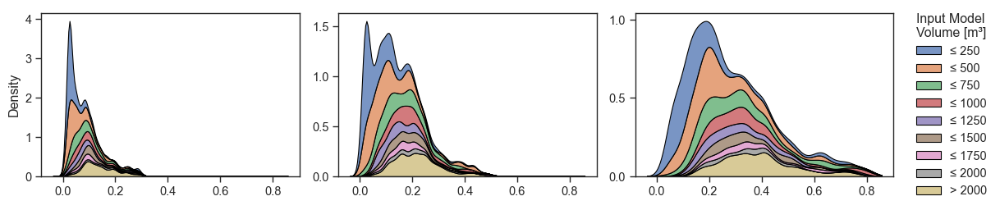

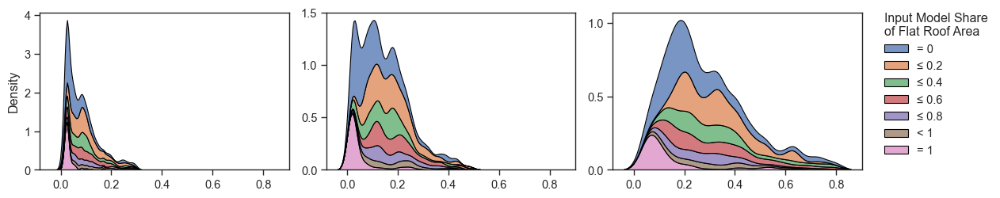

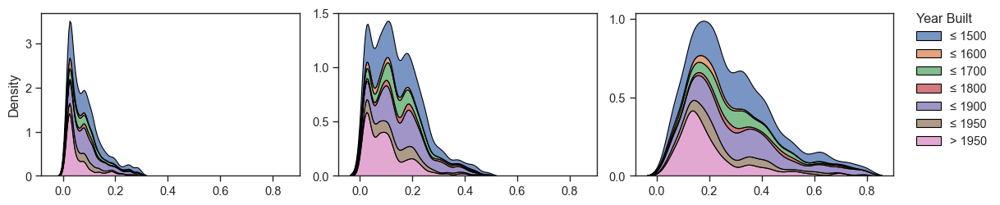

In [106]:
font_scale = 1.2
sns.set_theme(style="ticks", context="paper", font_scale=font_scale)

metric = "rms_min_dist_22"
densities = [64]  # [11.3]
errors = [0, .3, .6]
outlier_threshold = 3.5

multiple = "stack"
legend_out = True
adjust_xlims = False
xlims = {
    "0%": 0.25,
    "30%": 0.45,
    "60%": 0.65,
    "90%": 0.85
}

variables = ["n_faces_22_in", "b3_volume_lod22", "share_flat_roof", "oorspronkelijkbouwjaar"]
colnames_cut = [f"{variable}_cut" for variable in variables]
colnames_qcut = [f"{variable}_qcut" for variable in variables]
if legend_out:
    legend_titles = {
        "n_faces_22_in_cut": "Input Model\nNumber of Faces",
        "b3_volume_lod22_cut": "Input Model\nVolume [m³]",
        "share_flat_roof_cut": "Input Model Share\nof Flat Roof Area",
        "oorspronkelijkbouwjaar_cut": "Year Built"
    }
else:
    legend_titles = {
        "n_faces_22_in_cut": "Input Model Number of Faces",
        "b3_volume_lod22_cut": "Input Model Volume [m³]",
        "share_flat_roof_cut": "Input Model Share of\nFlat Roof Area",
        "oorspronkelijkbouwjaar_cut": "Year Built"
    }

data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score, threshold=outlier_threshold)].copy()
data = data[(data["Point Density"].isin(densities)) & (data["error_level"].isin(errors))]
data = data.rename(columns=legend_titles)


for k, variable in enumerate(legend_titles.values()):    
    g = sns.displot(
        data,
        x=metric,
        hue=variable,
        row="Point Density",
        col="Error Level",
        kind="kde",
        palette="deep",  # Spectral?
        multiple=multiple,
        # common_bins=False,  # for hist
        bw_adjust=.5,
        # cut=0,
        # common_norm=False,
        height=3,  # 2.5 for font_scale=1
        aspect=1.25,  # 1.5 for font_scale=1
        # log_scale=(False, True),
        # fill=True,
        # alpha=0.1,
        edgecolor="black",
        facet_kws=dict(
            sharex=False,
            sharey=False,
            # margin_titles=True,
            despine=False,
            legend_out=legend_out,
        )
    )
    
    # g.legend.update(dict(title=legend_titles[variable], alignment="left"))
    g.legend.update(dict(alignment="left"))
    g.set_xlabels("")#"RMS Minimum Distance [m]")
    if legend_out:
        sns.move_legend(g, "upper right", bbox_to_anchor=(1, 0.92))
    else:
        sns.move_legend(g, "upper right", bbox_to_anchor=(0.33, 0.88), ncols=2)
    g.figure.subplots_adjust(wspace=0.15)
    
    if multiple == "layer":
        vary_linestyles(g)
    for i, ((row_val, col_val), ax) in enumerate(g.axes_dict.items()):
        if k > 0:
            ax.set_title("")
        else:
            ax.set_title(f"Error Level = {col_val}")
        if adjust_xlims: # multiple in ["stack", "fill", "layer"]:
            ax.set_xlim(left=0, right=xlims[col_val])
        if font_scale > 1:
            if col_val == "60%":
                ax.set_yticks([0, 0.5, 1])
                ax.set_yticklabels(["0.0", "0.5", "1.0"])
    
    # plt.savefig(f"figures/group_displot_{variables[k]}{('_fontx' + str(font_scale)) if font_scale != 1 else ''}.png", dpi=300, bbox_inches="tight")
    plt.show()

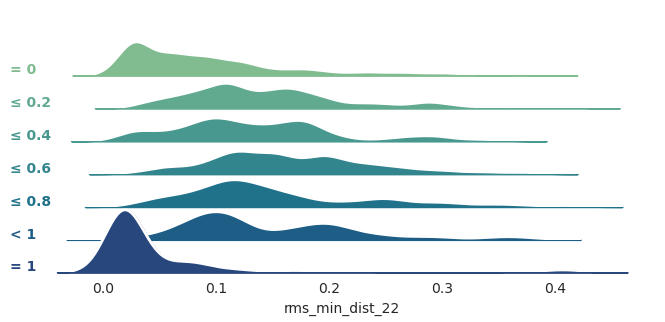

In [356]:
ridgeplot(data[data.error_level==.3], "rms_min_dist_22", "share_flat_roof_cut", hspace=-0.5, label_x=-0.03, palette="crest", kind="ridge")#, hue="error_level", fill=True, border_line=True, height=1, aspect=7)

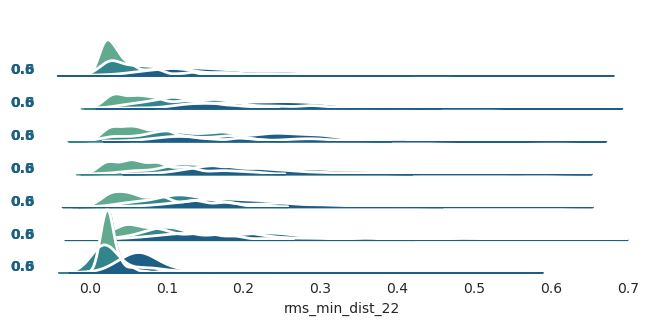

In [380]:
# data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)].copy()
# data = data[(data["Point Density"].isin(densities)) & (data["error_level"].isin(errors))]

ridgeplot(data, x="rms_min_dist_22", row="share_flat_roof_cut", hspace=-0.5, label_x=-0.03, palette="crest", kind="ridge", hue="error_level")

In [56]:
sns.set_theme(context="paper", style="white")

c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decora

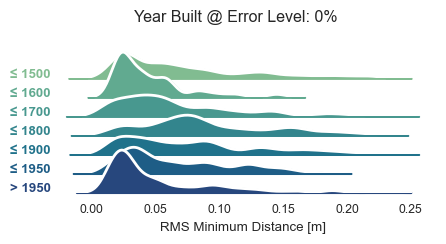

c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


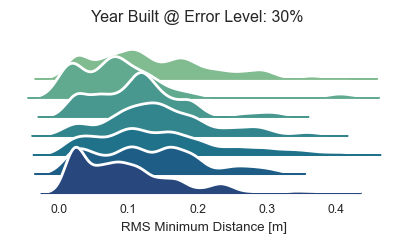

c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


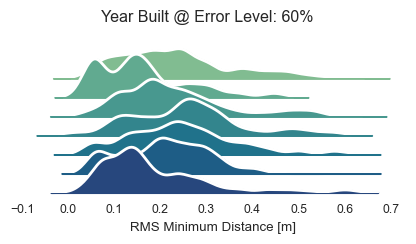

In [159]:
colname_cut = list(legend_titles.keys())[3]

densities = [11.3]
errors = [0, .3, .6]
outlier_threshold = 3.5

data = results_use if colname_cut == "gebruiksdoel" else results
data = data[~is_outlier_by_group(results, metric, outlier_func=modified_z_score, threshold=outlier_threshold)].copy()
data = data[(data["Point Density"].isin(densities)) & (data["error_level"].isin(errors))]

if colname_cut == "gebruiksdoel":
    gebruiksdoel_min_50 = ["woonfunctie", "industriefunctie", "kantoorfunctie", "winkelfunctie", "bijeenkomstfunctie"]
    data = data[data.gebruiksdoel.isin(gebruiksdoel_min_50)]
    data = data.sort_values(by = "gebruiksdoel")

for error in errors:
    g = ridgeplot(
        data[data.error_level == error],
        metric, colname_cut,
        # hspace=-0.8, height=0.3, aspect=16.67,  # quite narrow vertically
        hspace=-0.6, height=0.3, aspect=16.67,
        label_x=-0.1,
        palette="crest",
        # hue="error_level",
        xlabel="RMS Minimum Distance [m]",
        legend_labels=(error==errors[0])
    )
    # g.figure.suptitle(f"Error Level: {int(error*100)}%")
    variable_name = legend_titles[colname_cut].replace('\n', ' ')
    g.figure.suptitle(f"{variable_name} @ Error Level: {int(error*100)}%")
    plt.show()

c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\joypy\joyplot.py:176: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(by)


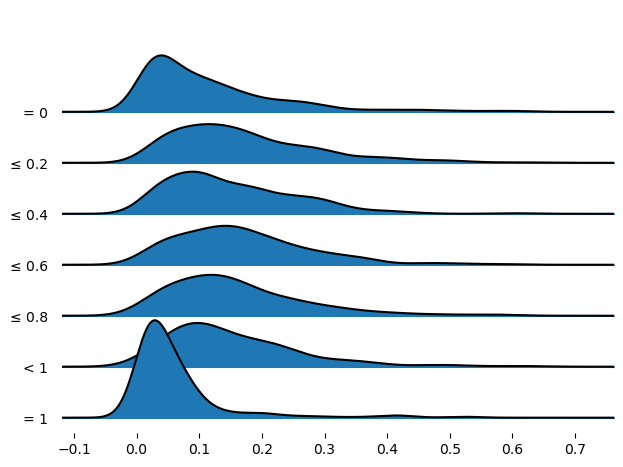

In [391]:
fig, axs = joypy.joyplot(data, by="share_flat_roof_cut", column="rms_min_dist_22")

##### Groups of Categorical Variables

C:\Users\Florian\AppData\Local\Temp\ipykernel_24620\2722633500.py:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data = results_use[~is_outlier_by_group(results, metric, outlier_func=modified_z_score, threshold=outlier_threshold)].copy()


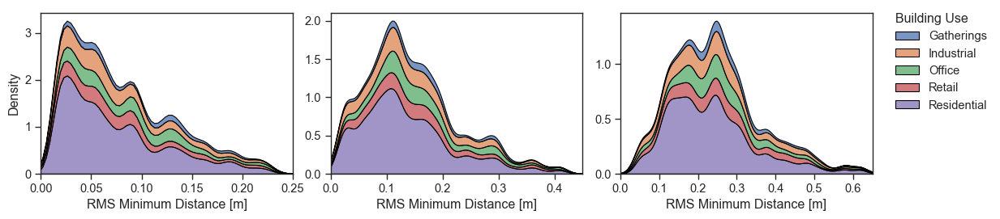

In [181]:
# This cell is adapted for "gebruiksdoel", using `results_use` and filtering categories

font_scale = 1.2
sns.set_theme(style="ticks", context="paper", font_scale=font_scale)

metric = "rms_min_dist_22"
densities = [11.3]
errors = [0, .3, .6]
outlier_threshold = 3.5

multiple = "stack"
legend_out = True
adjust_xlims = True
xlims = {
    "0%": 0.25,
    "30%": 0.45,
    "60%": 0.65,
    "90%": 0.85
}

variables = ["gebruiksdoel_en"]
legend_titles = {
    "gebruiksdoel_en": "Building Use"
}

data = results_use[~is_outlier_by_group(results, metric, outlier_func=modified_z_score, threshold=outlier_threshold)].copy()
data = data[(data["Point Density"].isin(densities)) & (data["error_level"].isin(errors))]

gebruiksdoel_min_50 = ["woonfunctie", "industriefunctie", "kantoorfunctie", "winkelfunctie", "bijeenkomstfunctie"]
data = data[data.gebruiksdoel_nl.isin(gebruiksdoel_min_50)]
data = data.sort_values(by=["gebruiksdoel_nl", "error_level"], ascending=True)#.sort_values(by="error_level")
data = data.rename(columns=legend_titles)

# Index contains duplicates due to previously applied .explode() and must therefore be reset
data = data.reset_index()


for k, variable in enumerate(legend_titles.values()):
    g = sns.displot(
        data,
        x=metric,
        hue=variable,
        row="Point Density",
        col="Error Level",
        kind="kde",
        palette="deep",
        multiple=multiple,
        # common_bins=False,  # for hist
        bw_adjust=.5,
        # cut=0,
        # common_norm=False,
        height=3,  # 2.5 for font_scale=1
        aspect=1.25,  # 1.5 for font_scale=1
        # log_scale=(False, True),
        # fill=True,
        # alpha=0.1,
        edgecolor="black",
        facet_kws=dict(
            sharex=False,
            sharey=False,
            # margin_titles=True,
            despine=False,
            legend_out=legend_out,
        )
    )
    
    # g.legend.update(dict(title=legend_titles[variable], alignment="left"))
    g.legend.update(dict(alignment="left"))
    g.set_xlabels("RMS Minimum Distance [m]")
    if legend_out:
        sns.move_legend(g, "upper right", bbox_to_anchor=(1, 0.92))
    else:
        sns.move_legend(g, "upper right", bbox_to_anchor=(0.335, 0.875), ncols=1)
    g.figure.subplots_adjust(wspace=0.15)
    
    if multiple == "layers":
        vary_linestyles(g)
    for i, ((row_val, col_val), ax) in enumerate(g.axes_dict.items()):
        if k == 0:
            ax.set_title("")
        if adjust_xlims: # multiple in ["stack", "fill", "layer"]:
            ax.set_xlim(left=0, right=xlims[col_val])
        if font_scale > 1:
            if col_val == "60%":
                ax.set_yticks([0, 0.5, 1])
                ax.set_yticklabels(["0.0", "0.5", "1.0"])
    
    # plt.savefig(f"figures/group_displot_{variables[k]}{('_fontx' + str(font_scale)) if font_scale != 1 else ''}.png", dpi=300, bbox_inches="tight")
    plt.show()

c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decora

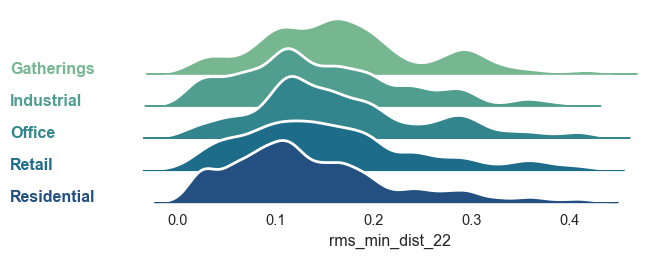

In [184]:
ridgeplot(data[data.error_level == .3], "rms_min_dist_22", "Building Use", hspace=-0.5, label_x=-0.2, palette="crest", kind="ridge")

In [175]:
for error in errors:
    value_counts = data[data.error_level == error].gebruiksdoel.value_counts()
    print(value_counts)
    print(value_counts.sum())

gebruiksdoel
woonfunctie                792
industriefunctie           233
kantoorfunctie             204
winkelfunctie              188
bijeenkomstfunctie          82
overige gebruiksfunctie     36
logiesfunctie               21
onderwijsfunctie            13
gezondheidszorgfunctie       3
Name: count, dtype: int64
1572
gebruiksdoel
woonfunctie                817
industriefunctie           246
kantoorfunctie             219
winkelfunctie              196
bijeenkomstfunctie          85
overige gebruiksfunctie     38
logiesfunctie               24
onderwijsfunctie            13
gezondheidszorgfunctie       4
Name: count, dtype: int64
1642
gebruiksdoel
woonfunctie                820
industriefunctie           249
kantoorfunctie             220
winkelfunctie              202
bijeenkomstfunctie          91
overige gebruiksfunctie     37
logiesfunctie               21
onderwijsfunctie            13
gezondheidszorgfunctie       4
Name: count, dtype: int64
1657


##### A Single Variable in Many Scenarios

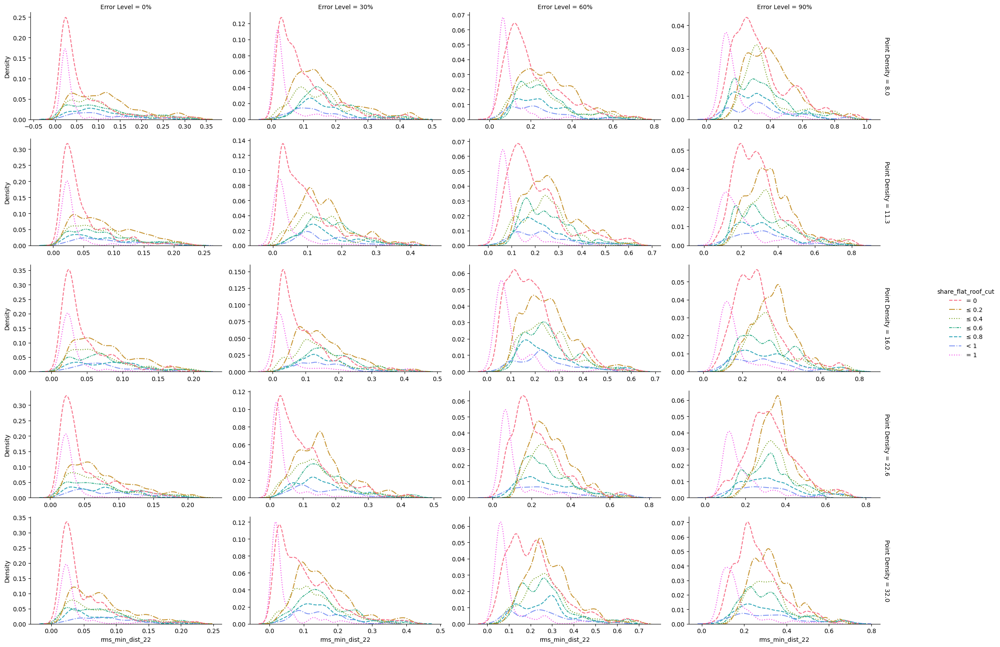

In [153]:
densities = [8, 11.3, 16, 22.6, 32]
errors = [0, .3, .6, .9]

variable = "share_flat_roof"
colname_cut = f"{variable}_cut"
colname_qcut = f"{variable}_qcut"

data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)].copy()
data = data[(data["Point Density"].isin(densities)) & (data["error_level"].isin(errors))]
if variable == "gebruiksdoel":
    data = data.reset_index()

hue_colname = colname_cut

g = sns.displot(
    data,
    x=metric,
    hue=hue_colname,
    row="Point Density",
    col="Error Level",
    kind="kde",
    palette="husl",
    multiple="layer",
    bw_adjust=.5,
    # cut=0,
    common_norm=True,
    height=3,
    aspect=1.8,
    # log_scale=(False, True),
    facet_kws=dict(
        sharex=False,
        sharey=False,
        margin_titles=True
    )
)
vary_linestyles(g)
plt.show()

#### Single KDE Plot

In [173]:
densities = [11.3]
errors = [0.3]

data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score, threshold=3.5)].copy()
data = data[(data["Point Density"].isin(densities)) & (data["error_level"].isin(errors))]

if variable == "gebruiksdoel":
    data = data.reset_index()

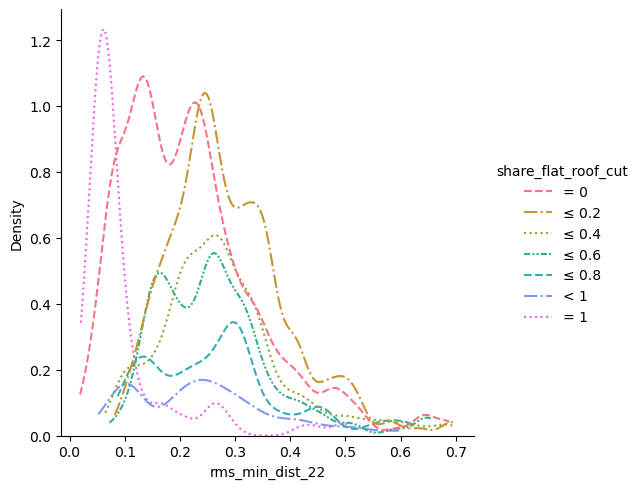

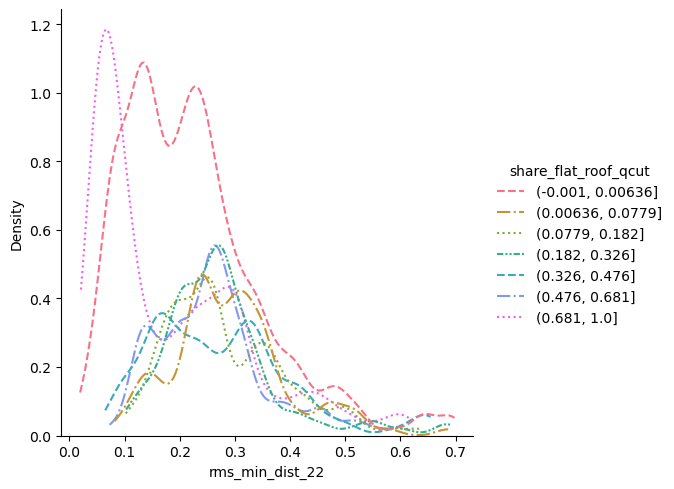

In [148]:
if cut:
    g = sns.displot(data, x=metric, hue=colname_cut, kind="kde", palette="husl", multiple="layer", bw_adjust=.5, cut=0, common_norm=True)
    vary_linestyles(g)
    plt.show()

if qcut:
    data = data.sort_values(by=colname_qcut, ascending=True)
    g = sns.displot(data, x=metric, hue=colname_qcut, kind="kde", palette="husl", multiple="layer", bw_adjust=.5, cut=0)
    vary_linestyles(g)
    plt.show()

#### Correlations

In [180]:
data.groupby("oorspronkelijkbouwjaar_cut")["share_flat_roof"].agg(["mean", "std"])

C:\Users\Florian\AppData\Local\Temp\ipykernel_24620\1447973338.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.groupby("oorspronkelijkbouwjaar_cut")["share_flat_roof"].agg(["mean", "std"])


,mean,std
oorspronkelijkbouwjaar_cut,,
≤ 1500,0.286862,0.342334
≤ 1600,0.422693,0.433045
≤ 1700,0.236033,0.311709
≤ 1800,0.250729,0.330501
≤ 1900,0.320395,0.337916
≤ 1950,0.306545,0.326279
> 1950,0.407660,0.373202


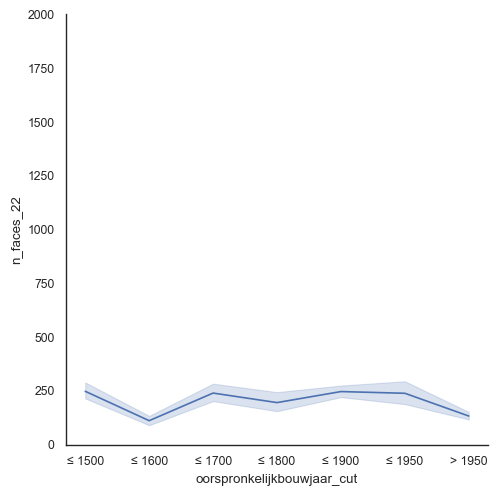

In [174]:
g = sns.relplot(data, x="oorspronkelijkbouwjaar_cut", y="n_faces_22", kind="line", estimator="mean")
g.set(ylim=(0, 2000))

In [111]:
data.n_faces_22.shape

(1019,)

In [131]:
for vol_bound in [1000*i for i in range(1, 11)] + [10000*i for i in range(2, 8)]:
    print(vol_bound)
    print(np.corrcoef(data.b3_volume_lod22[~data.n_faces_22.isna()][data.b3_volume_lod22 < vol_bound], data.n_faces_22.dropna()[data.b3_volume_lod22 < vol_bound]))

1000
[[1.         0.63678912]
 [0.63678912 1.        ]]
2000
[[1.         0.68686596]
 [0.68686596 1.        ]]
3000
[[1.         0.70800547]
 [0.70800547 1.        ]]
4000
[[1.         0.72654735]
 [0.72654735 1.        ]]
5000
[[1.         0.75316184]
 [0.75316184 1.        ]]
6000
[[1.         0.76131435]
 [0.76131435 1.        ]]
7000
[[1.         0.77960022]
 [0.77960022 1.        ]]
8000
[[1.         0.77960022]
 [0.77960022 1.        ]]
9000
[[1.         0.77960022]
 [0.77960022 1.        ]]
10000
[[1.         0.77769622]
 [0.77769622 1.        ]]
20000
[[1.         0.77090343]
 [0.77090343 1.        ]]
30000
[[1.         0.73985892]
 [0.73985892 1.        ]]
40000
[[1.         0.67272211]
 [0.67272211 1.        ]]
50000
[[1.         0.71549995]
 [0.71549995 1.        ]]
60000
[[1.         0.71549995]
 [0.71549995 1.        ]]
70000
[[1.         0.79993253]
 [0.79993253 1.        ]]


<Axes: xlabel='oorspronkelijkbouwjaar', ylabel='n_faces_22'>

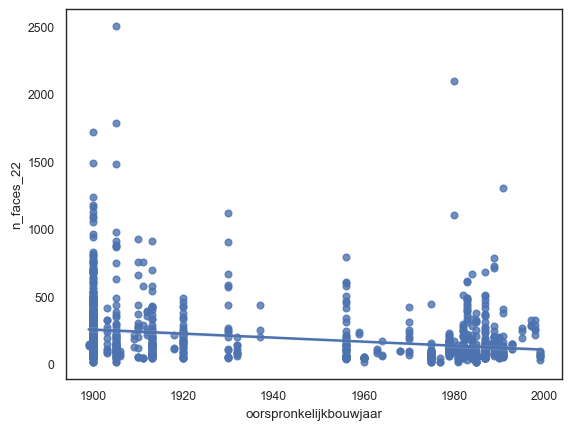

In [171]:
sns.regplot(data[is_between(data.oorspronkelijkbouwjaar, 1899, 2000)], x="oorspronkelijkbouwjaar", y="n_faces_22")

<Axes: xlabel='oorspronkelijkbouwjaar_cut', ylabel='n_faces_22'>

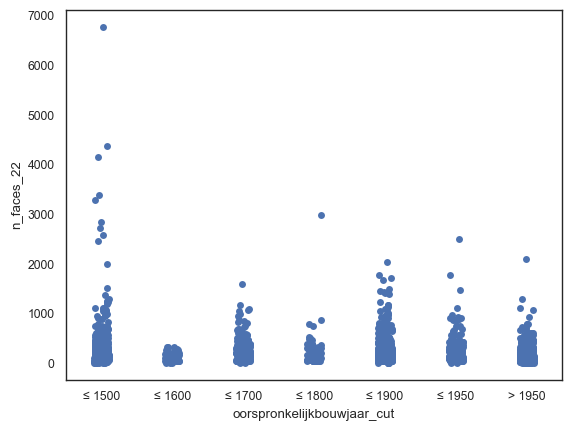

In [160]:
sns.stripplot(data, x="oorspronkelijkbouwjaar_cut", y="n_faces_22")

(0.0, 500.0)

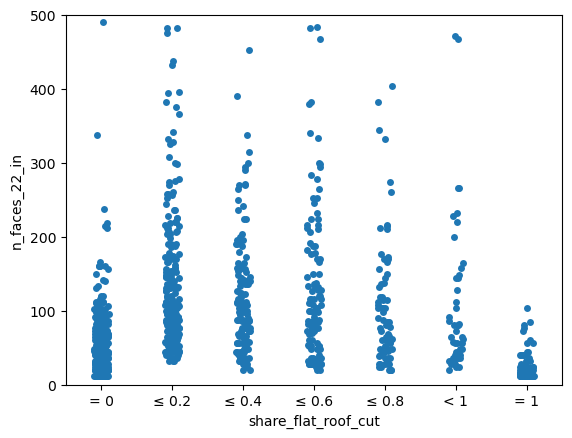

In [59]:
ax = sns.stripplot(data, x="share_flat_roof_cut", y="n_faces_22_in")
ax.set_ylim(0, 500)

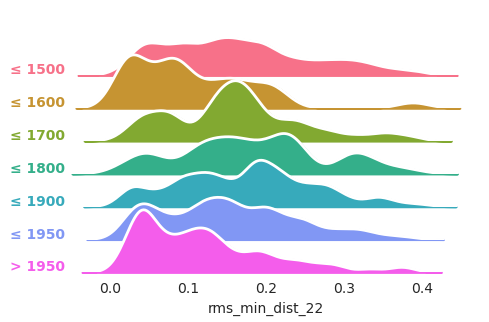

In [61]:
if cut:
    # g = ridgeplot(data, metric, colname_cut)
    g = ridgeplot(data, metric, colname_cut, hspace=-0.5, aspect=10, label_x=-0.1)
    plt.show()

# if qcut:
#     data = data.sort_values(by=colname_qcut, ascending=True)
#     g = ridgeplot(data, metric, colname_qcut)
#     plt.show()

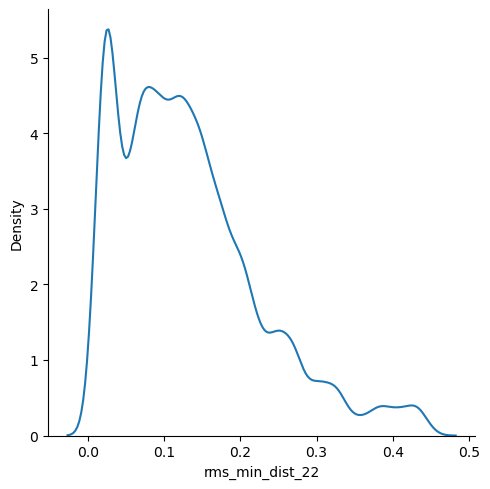

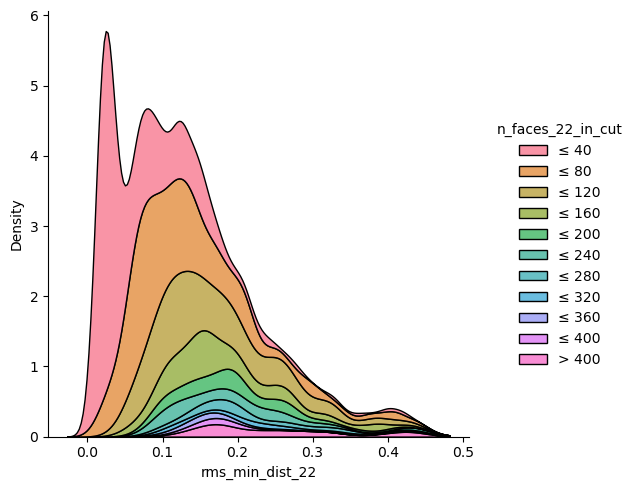

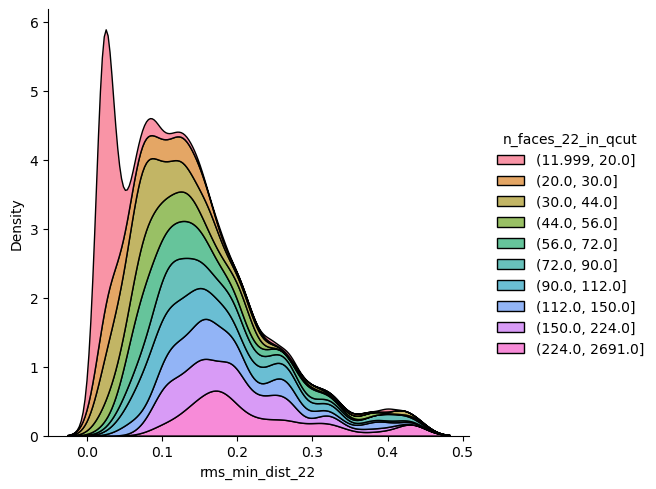

In [110]:
sns.displot(data, x=metric, kind="kde", bw_adjust=.5)
if cut:
    sns.displot(data, x=metric, hue=colname_cut, kind="kde", multiple="stack", palette="husl", bw_adjust=.5)
    plt.show()
if qcut:
    sns.displot(data, x=metric, hue=colname_qcut, kind="kde", multiple="stack", palette="husl", bw_adjust=.5)
    plt.show()

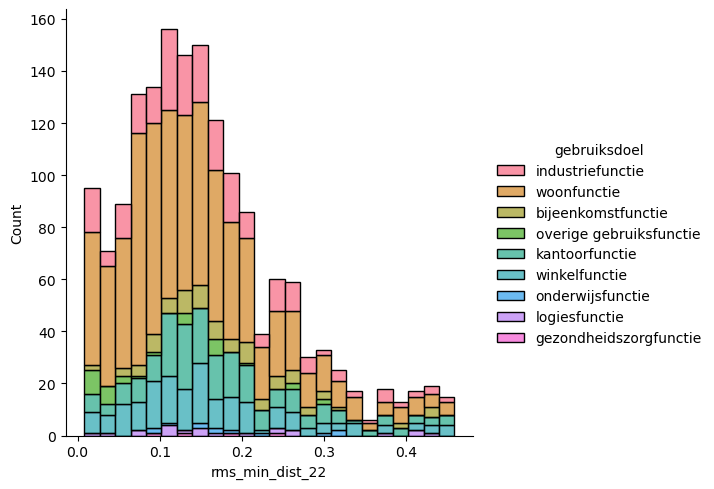

In [45]:
if cut:
    sns.displot(data, x=metric, hue=colname_cut, kind="hist", multiple="stack", palette="husl")
    plt.show()
if qcut:
    sns.displot(data, x=metric, hue=colname_qcut, kind="hist", multiple="stack", palette="husl")
    plt.show()

#### Line Plots by Groups

In [53]:
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)].copy()
if variable == "gebruiksdoel":
    data = data.reset_index()
print(data.shape)

groups = data[colname_cut].unique()
n_groups = len(groups)
print(n_groups)

(231145, 369)
10


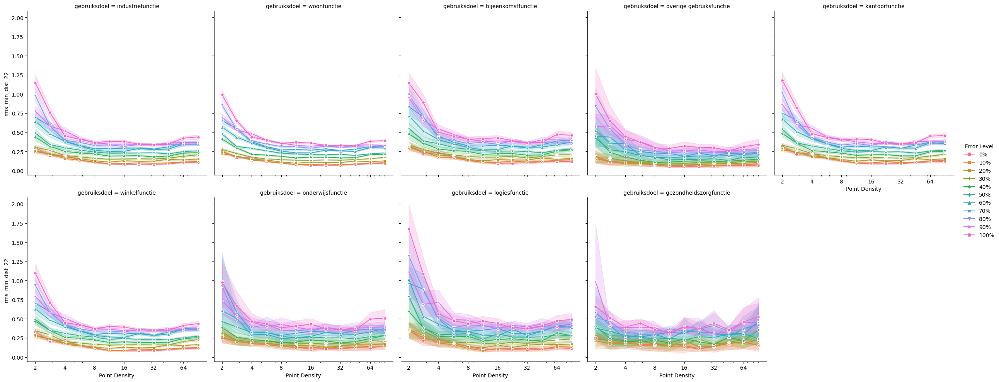

In [54]:
g = sns.relplot(data, x="Point Density", y=metric, hue="Error Level", col=colname_cut, col_wrap=5, kind="line", style="Error Level", markers=True, dashes=False)

for _, ax in g.axes_dict.items():
    ax.set_xscale("log")
    ax.set_xticks([2**i for i in range(1, 7)])
    ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

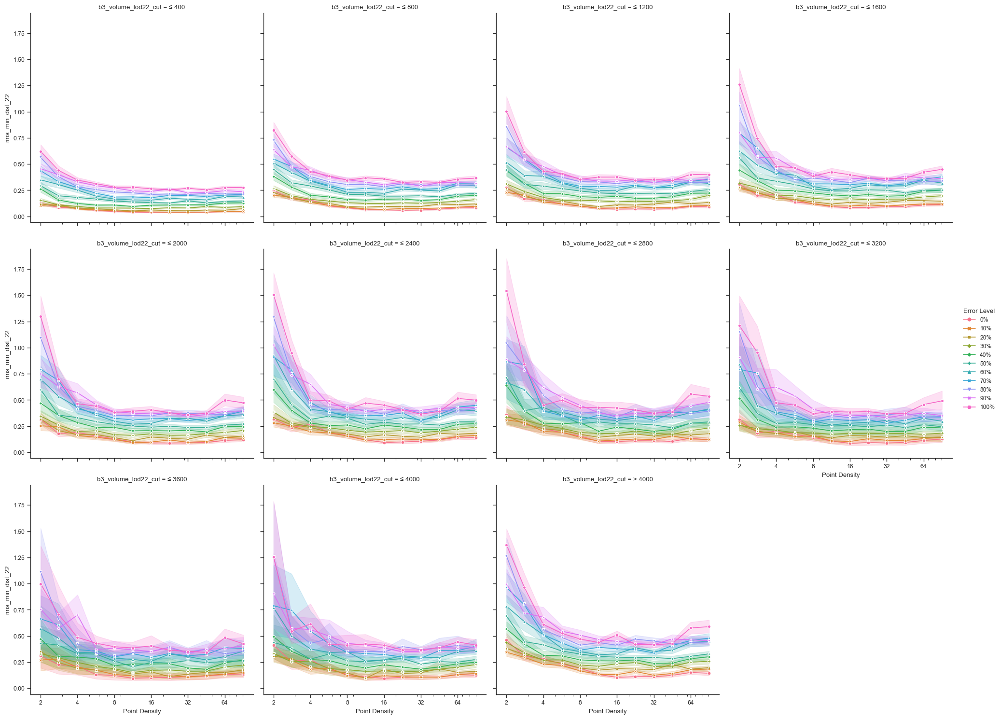

In [ ]:
g = sns.relplot(data, x="Point Density", y=metric, hue="Error Level", col=colname_cut, col_wrap=4, kind="line", style="Error Level", markers=True, dashes=False)

for _, ax in g.axes_dict.items():
    ax.set_xscale("log")
    ax.set_xticks([2**i for i in range(1, 7)])
    ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

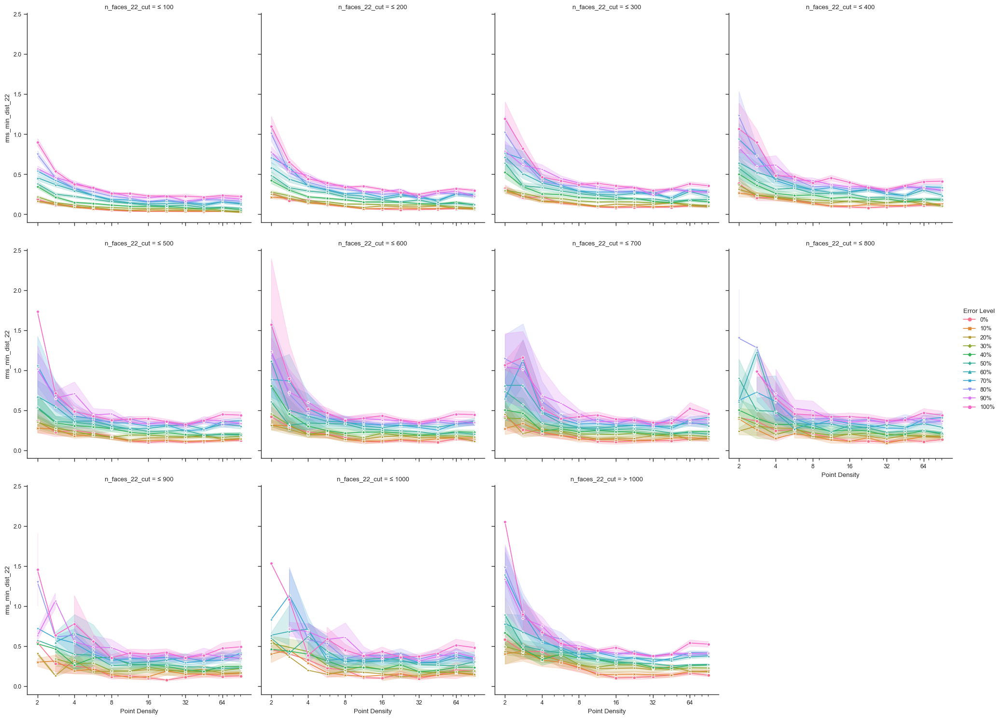

In [ ]:
g = sns.relplot(data, x="Point Density", y=metric, hue="Error Level", col=colname_cut, col_wrap=4, kind="line", style="Error Level", markers=True, dashes=False)

for _, ax in g.axes_dict.items():
    ax.set_xscale("log")
    ax.set_xticks([2**i for i in range(1, 7)])
    ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

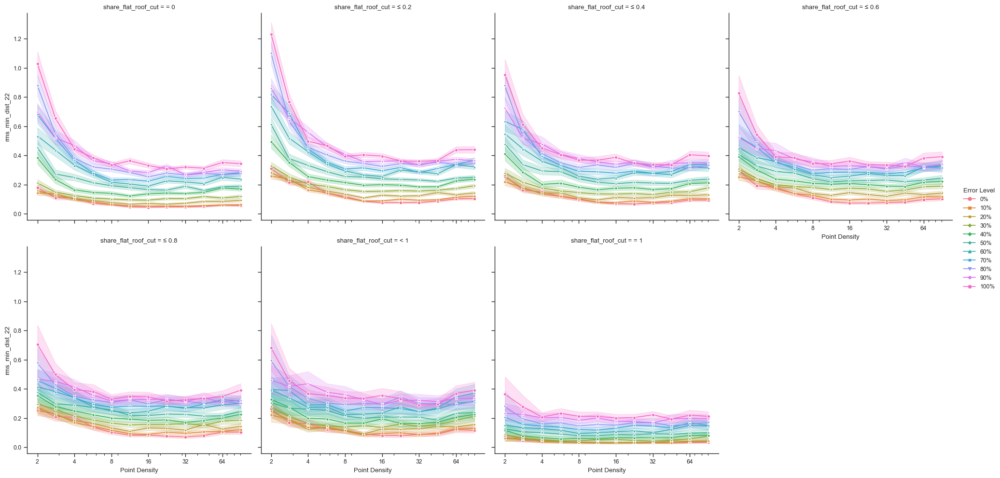

In [ ]:
g = sns.relplot(data, x="Point Density", y=metric, hue="Error Level", col=colname_cut, col_wrap=4, kind="line", style="Error Level", markers=True, dashes=False)

for _, ax in g.axes_dict.items():
    ax.set_xscale("log")
    ax.set_xticks([2**i for i in range(1, 7)])
    ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

### Gridded Histograms

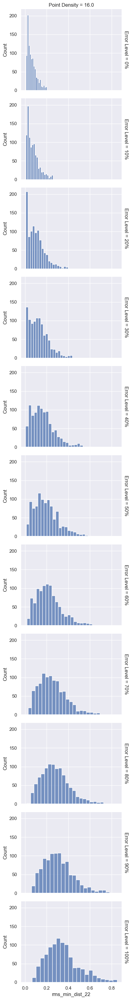

In [93]:
sns.set_style("darkgrid")
hist_grid("rms_min_dist_22", density_range=(15, 17), height=3, aspect=1.5)

In [ ]:
metric = "rms_min_dist_22"
data = results[["Point Density", "Error Level", "rms_min_dist_22"]]
g = sns.FacetGrid(data, row="Error Level", col="Point Density", height=2, margin_titles=True, sharex=False)
for (err, dens), ax in g.axes_dict.items():
    this_data = data[(data["Error Level"] == err) & (data["Point Density"] == dens)]
    this_binrange = (np.min(this_data[metric]), np.nanquantile(this_data[metric], 0.95))
    sns.histplot(ax = ax, data=this_data[metric], binrange=this_binrange)

### Ridge Plot

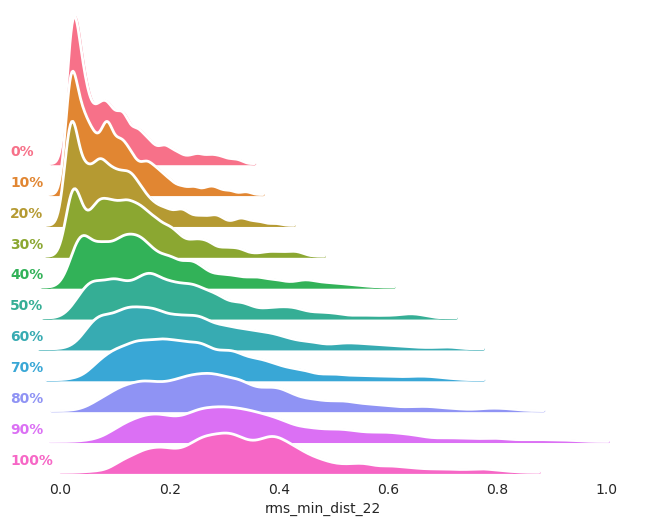

In [105]:
ridgeplot_errors("rms_min_dist_22", 8)

c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


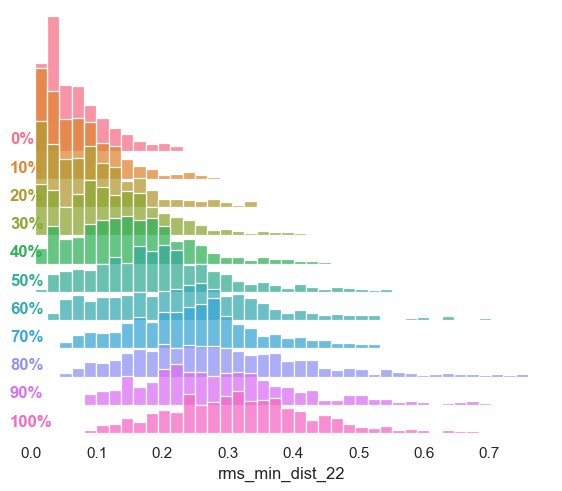

In [120]:
ridgeplot_hist_errors("rms_min_dist_22", 32)

## Hausdorff Distance

### Heatmap

<Axes: xlabel='Point Density [pt m$^{-2}$]', ylabel='Error Level'>

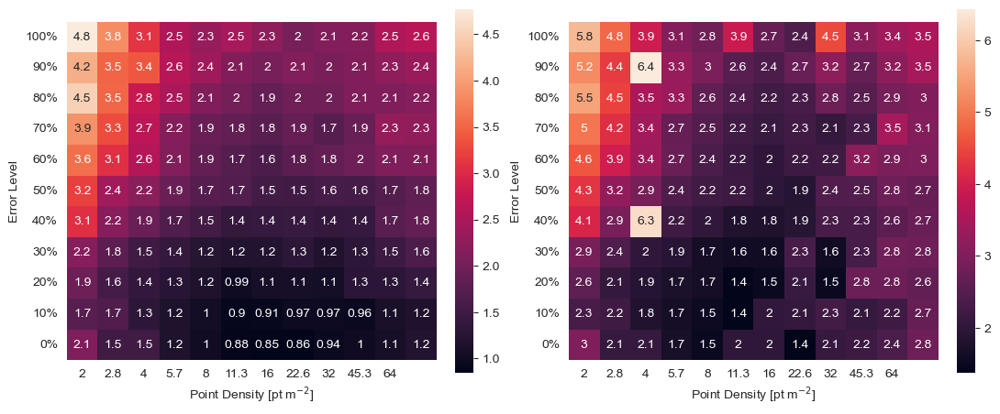

In [313]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10.8, 4.5), constrained_layout=True)
heatmap("hausdorff_22_mean", ax=axs[0], annot=True, fmt=".2g")
heatmap("hausdorff_22_rms", ax=axs[1], annot=True, fmt=".2g")

### Histograms

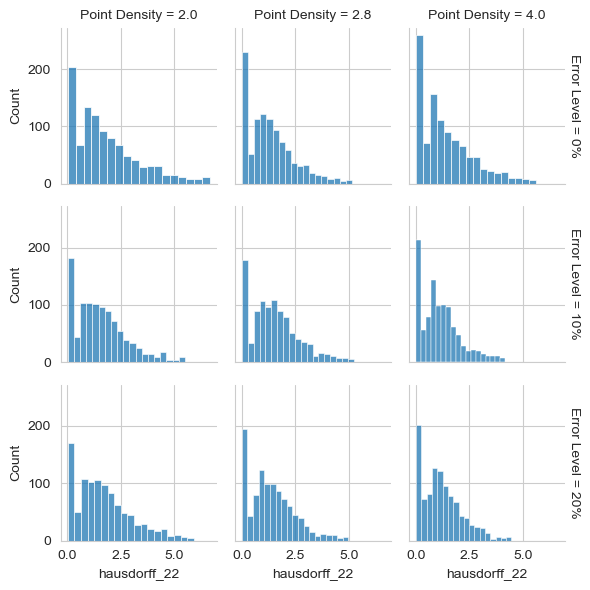

In [310]:
hist_grid("hausdorff_22")

### Line Plots

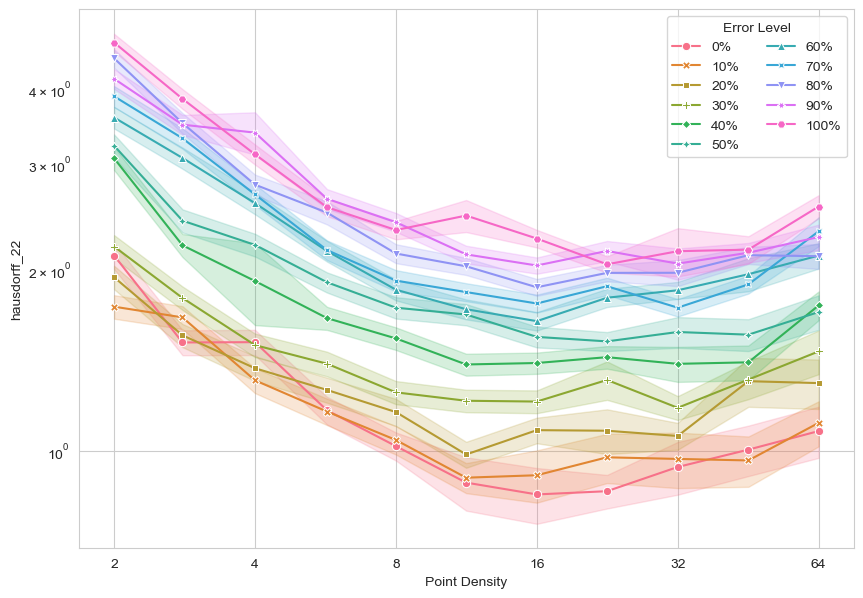

In [104]:
# sns.lineplot(ax=ax, data=results[results["Error Level"] == "0%"], x="Point Density", y="rms_min_dist_22")
# sns.lineplot(ax=ax, data=results[results["Error Level"] == "0%"], x="Point Density", y="rms_min_dist_22", hue="Error Level", units="identificatie", estimator=None, lw=1)

fig, ax = plt.subplots(figsize=(10, 7))

data=results#[results["Error Level"] == "100%"]
sns.lineplot(ax=ax, data=data, x="Point Density", y="hausdorff_22", hue="Error Level", style="Error Level", markers=True, dashes=False, err_style="band", estimator="mean", errorbar=("sd", 0.05))
plt.legend(ncols=2, title="Error Level")

ax.set_xscale("log")
ax.set_xticks([2**i for i in range(1, 7)])
ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

ax.set_yscale("log")
# ax.set_yticks([i/10 for i in range(1, 11)])
# ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

# ax.set_ylim(bottom=0)

(0.0, 6.688201068434996)

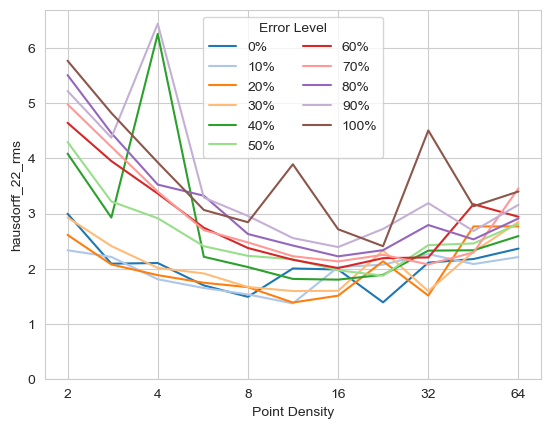

In [155]:
ax = sns.lineplot(e.summary_stats, x="Point Density", y="hausdorff_22_rms", hue="Error Level", palette="tab20")
plt.legend(ncols=2, title="Error Level")

ax.set_xscale("log")
ax.set_xticks([2**i for i in range(1, 7)])
ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

ax.set_ylim(bottom=0)

# Complexity

## Heatmap

<Axes: xlabel='Point Density [pt m$^{-2}$]', ylabel='Error Level'>

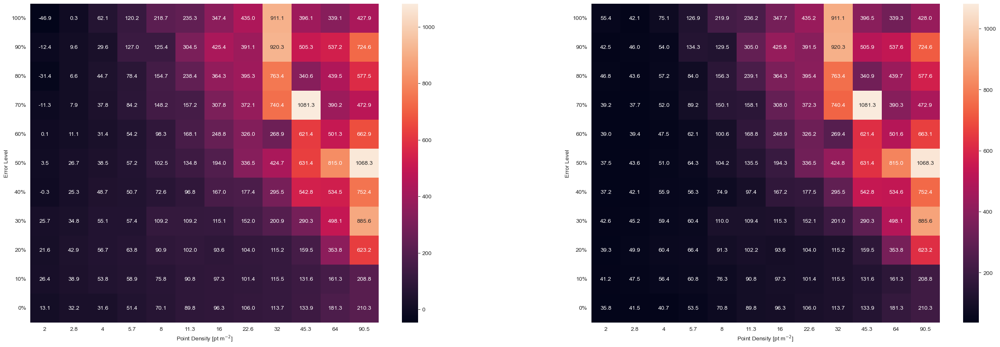

In [323]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(32, 10), constrained_layout=False)
heatmap("n_faces_22_diff_mean", ax=axs[0], annot=True, fmt=".1f")
heatmap("n_faces_22_abs_diff_mean", ax=axs[1], annot=True, fmt=".1f")

## Ridge Plots

c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decora

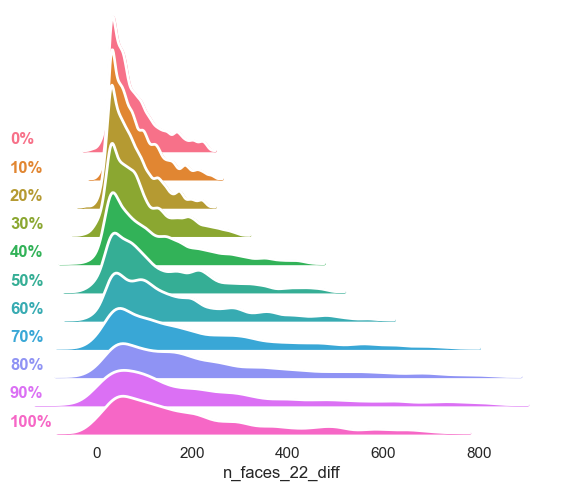

In [114]:
ridgeplot_errors("n_faces_22_diff", density=16)

## Histograms

In [ ]:
metric = "n_faces_22_abs_diff"
ax = sns.histplot(data, x=metric, binrange=(np.min(data[metric]), np.nanquantile(data[metric], 0.99)))#, bins=np.arange(0, 3.1, 0.1))
# ax.set_yscale("log")

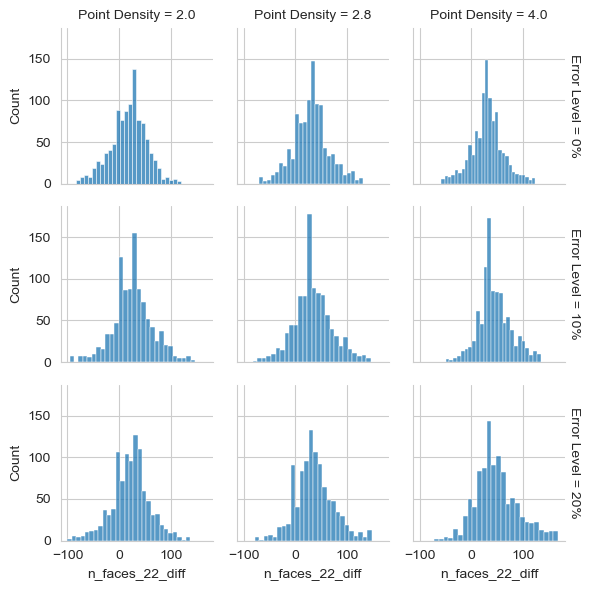

In [308]:
hist_grid("n_faces_22_diff")

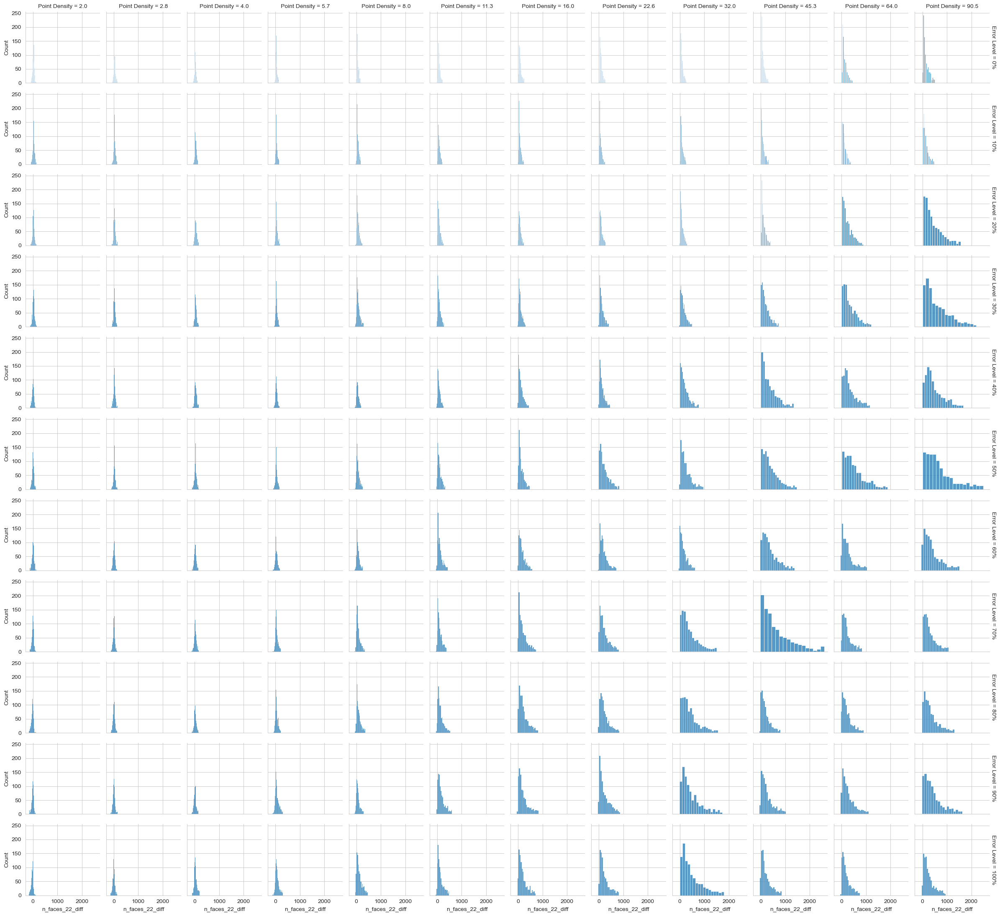

In [295]:
hist_grid("n_faces_22_diff", (0, 100), (0, 1))

## Line Plots

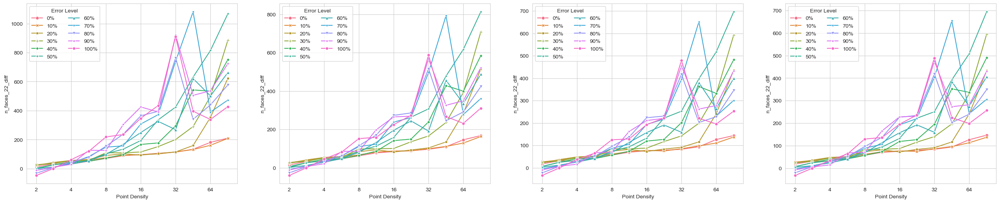

In [324]:
fig, axs = plt.subplots(1, 4, figsize=(32, 6))
for ax, mt, th in zip(axs, [None, is_outlier, modified_z_score, iqr_outliers], [None, 1e1, 3.5, 1.5]):
    lineplot(results, "n_faces_22_diff", ax=ax, outlier_method="group", outlier_func=mt, outlier_threshold=th, errorbar=None)

## Combined KDE Plots

### Face Number Difference

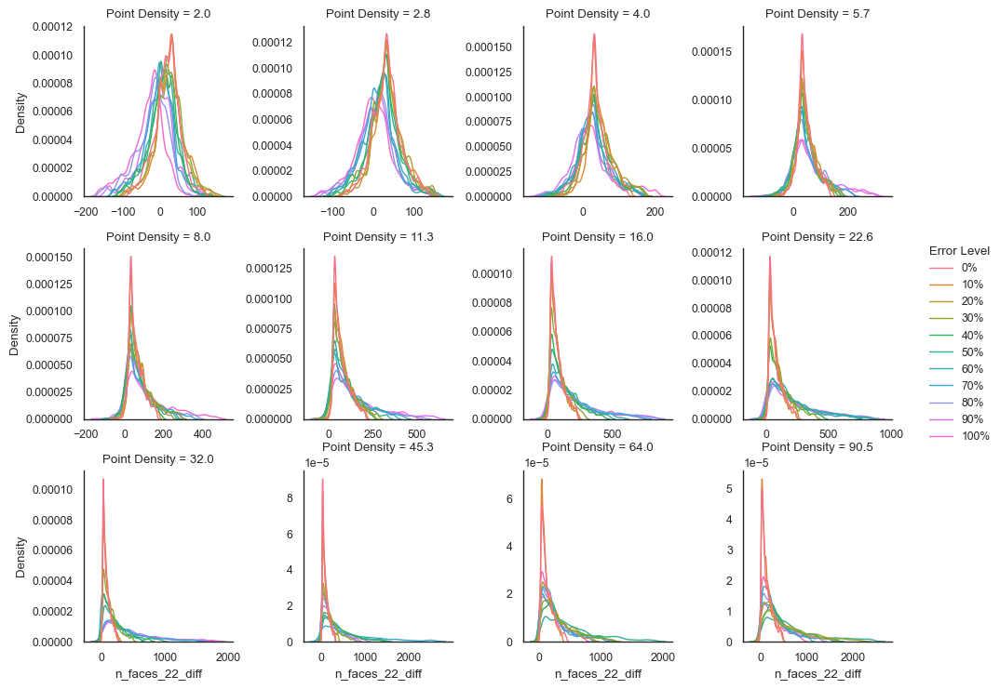

In [ ]:
metric = "n_faces_22_diff"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density", col_wrap=4, kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=2.5, aspect=1, linewidth=1)

### Face Number Ratio

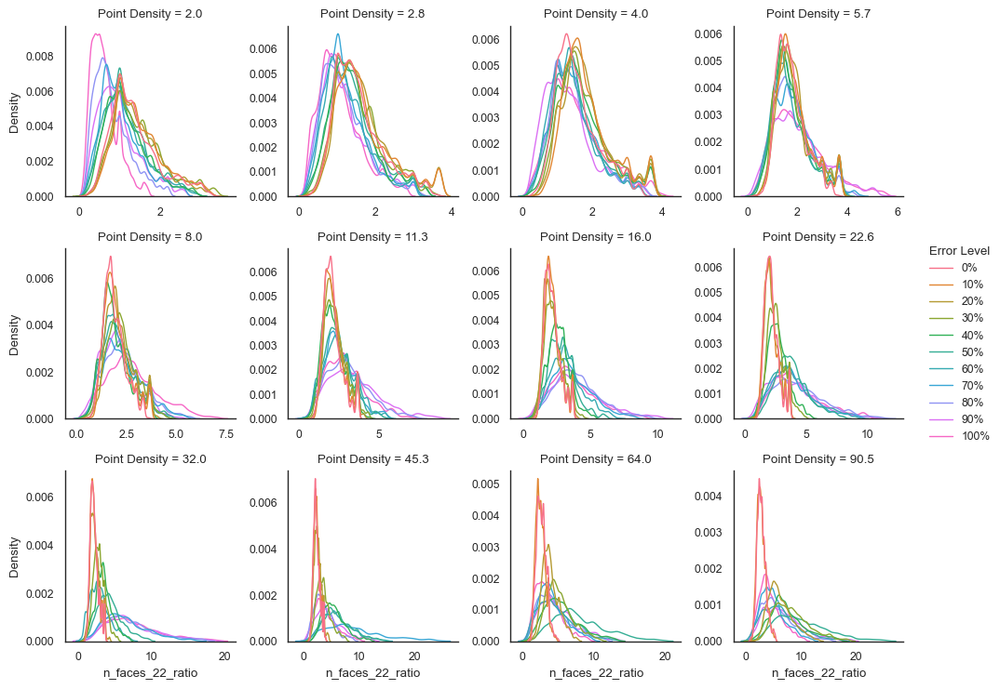

In [36]:
metric = "n_faces_22_ratio"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density", col_wrap=4, kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=2.5, aspect=1, linewidth=1)

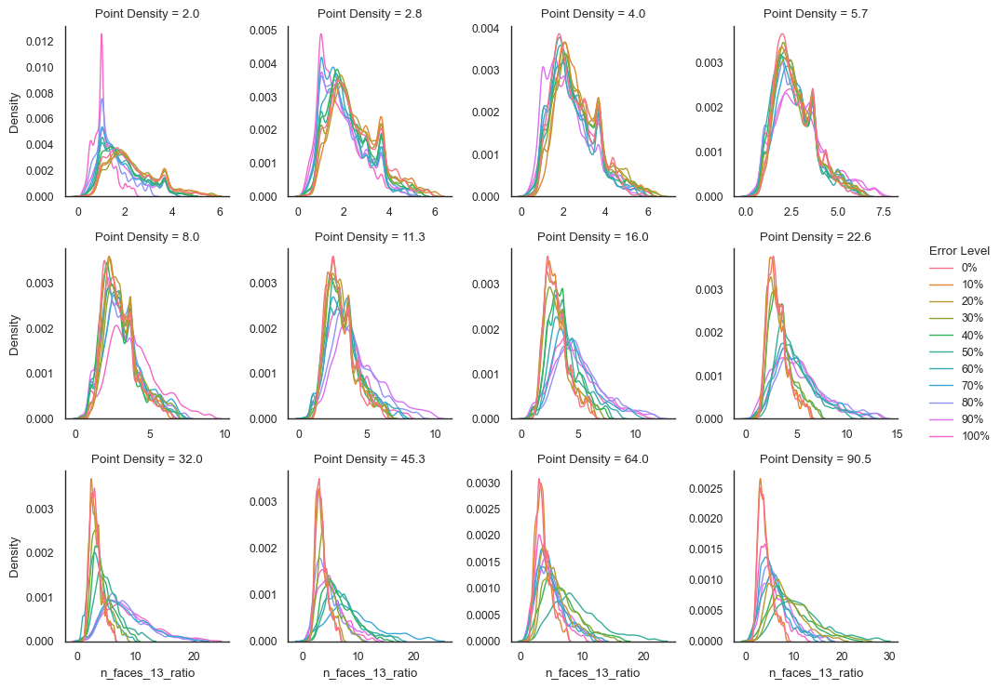

In [39]:
metric = "n_faces_13_ratio"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density", col_wrap=4, kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=2.5, aspect=1, linewidth=1)

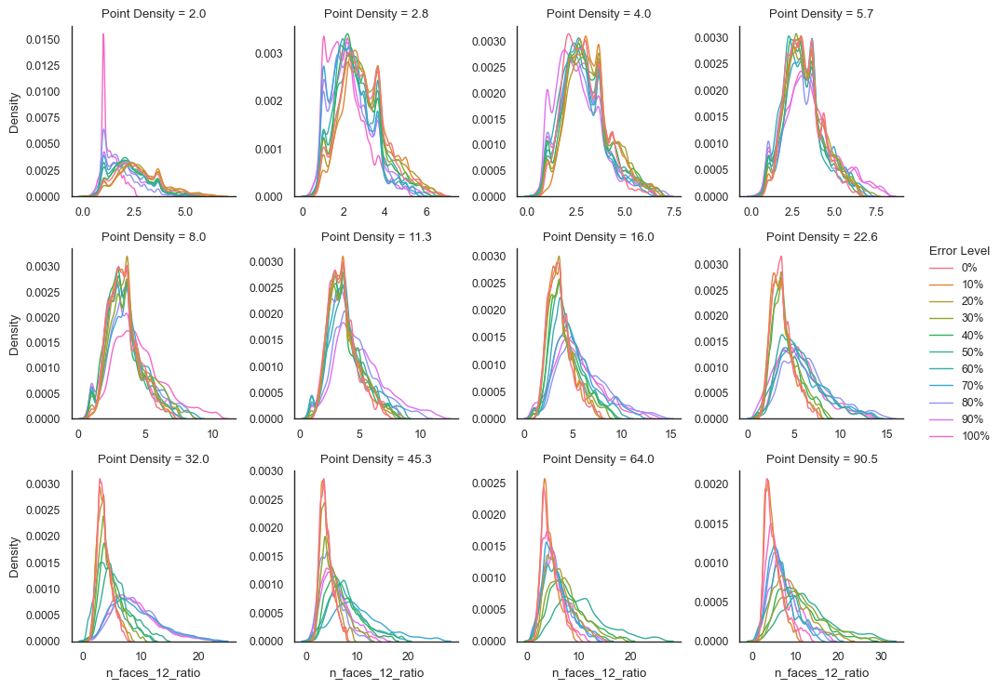

In [40]:
metric = "n_faces_12_ratio"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density", col_wrap=4, kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=2.5, aspect=1, linewidth=1)

# Height

## Ridge Plots

c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\Florian\miniconda3\envs\pyhelios_env_10\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decora

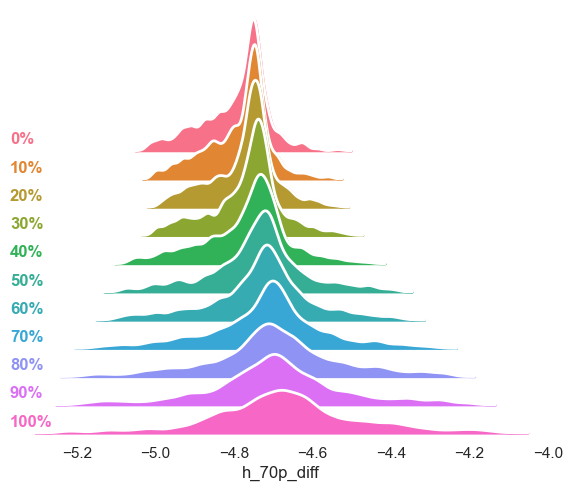

In [110]:
ridgeplot_errors("h_70p_diff", density=4)

### Histograms

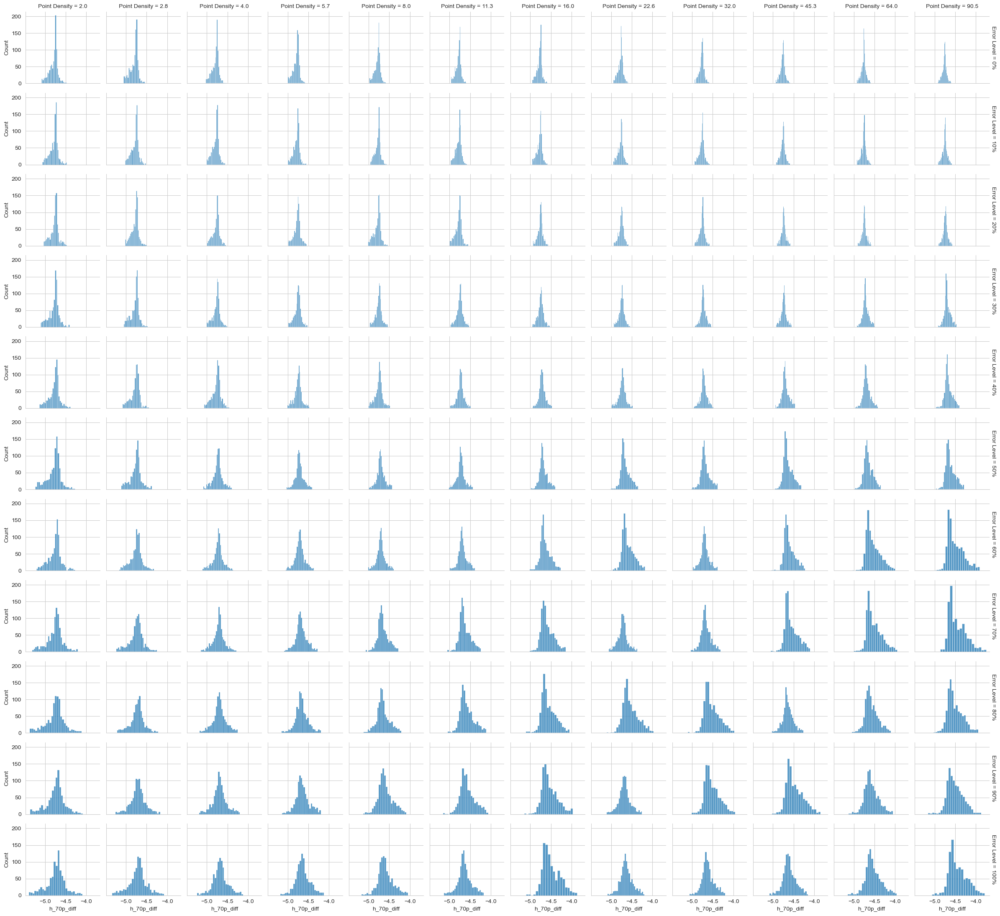

In [335]:
hist_grid("h_70p_diff", density_range=(0, 100), error_range=(0, 1))

## Line Plot

In [93]:
results["Point Density"].unique()

array([ 2. ,  2.8,  4. ,  5.7,  8. , 11.3, 16. , 22.6, 32. , 45.3, 64. ])

In [ ]:
filt = results[["h_max_diff", "h_max_in", "h_max_out"]].copy()
filt["diff_outlier"] = is_outlier(filt["h_max_diff"], 1e2)
print(sum(filt.diff_outlier))
filt

In [111]:
filt = results[["h_max_diff", "h_max_in", "h_max_out"]][(results["Error Level"] == "60%") & (results["Point Density"] == 11.3)]
filt["diff_outlier"] = is_outlier(filt["h_max_diff"], 1e3)
print(sum(filt.diff_outlier))
filt

2


h_max_diff  h_max_in  h_max_out  \
scenario     identificatie                                                     
scenario_061 NL.IMBAG.Pand.0344100000000004   -4.448788     12.73   8.281212   
             NL.IMBAG.Pand.0344100000000005   -4.553909     14.42   9.866091   
             NL.IMBAG.Pand.0344100000000030   -4.569942     10.82   6.250057   
             NL.IMBAG.Pand.0344100000000031   -4.502280      8.56   4.057720   
             NL.IMBAG.Pand.0344100000000032   -4.510550      7.38   2.869450   
...                                                 ...       ...        ...   
             NL.IMBAG.Pand.0344100000030833         NaN     15.02        NaN   
             NL.IMBAG.Pand.0344100000156320         NaN      7.13        NaN   
             NL.IMBAG.Pand.0344100000020891         NaN     21.91        NaN   
             NL.IMBAG.Pand.0344100000138308         NaN     12.18        NaN   
             NL.IMBAG.Pand.0344100000152481         NaN     20.58        NaN   

                                             diff_outlier  
scenario     identificatie                                 
scenario_061 NL.IMBAG.Pand.0344100000000004         False  
             NL.IMBAG.Pand.0344100000000005         False  
             NL.IMBAG.Pand.0344100000000030         False  
             NL.IMBAG.Pand.0344100000000031         False  
             NL.IMBAG.Pand.0344100000000032         False  
...                                                   ...  
             NL.IMBAG.Pand.0344100000030833         False  
             NL.IMBAG.Pand.0344100000156320         False  
             NL.IMBAG.Pand.0344100000020891         False  
             NL.IMBAG.Pand.0344100000138308         False  
             NL.IMBAG.Pand.0344100000152481         False  

[1078 rows x 4 columns]

In [113]:
filt[~is_outlier(filt["h_max_diff"], 1e3)]

h_max_diff  h_max_in  h_max_out  \
scenario     identificatie                                                     
scenario_061 NL.IMBAG.Pand.0344100000000004   -4.448788     12.73   8.281212   
             NL.IMBAG.Pand.0344100000000005   -4.553909     14.42   9.866091   
             NL.IMBAG.Pand.0344100000000030   -4.569942     10.82   6.250057   
             NL.IMBAG.Pand.0344100000000031   -4.502280      8.56   4.057720   
             NL.IMBAG.Pand.0344100000000032   -4.510550      7.38   2.869450   
...                                                 ...       ...        ...   
             NL.IMBAG.Pand.0344100000030833         NaN     15.02        NaN   
             NL.IMBAG.Pand.0344100000156320         NaN      7.13        NaN   
             NL.IMBAG.Pand.0344100000020891         NaN     21.91        NaN   
             NL.IMBAG.Pand.0344100000138308         NaN     12.18        NaN   
             NL.IMBAG.Pand.0344100000152481         NaN     20.58        NaN   

                                             diff_outlier  
scenario     identificatie                                 
scenario_061 NL.IMBAG.Pand.0344100000000004         False  
             NL.IMBAG.Pand.0344100000000005         False  
             NL.IMBAG.Pand.0344100000000030         False  
             NL.IMBAG.Pand.0344100000000031         False  
             NL.IMBAG.Pand.0344100000000032         False  
...                                                   ...  
             NL.IMBAG.Pand.0344100000030833         False  
             NL.IMBAG.Pand.0344100000156320         False  
             NL.IMBAG.Pand.0344100000020891         False  
             NL.IMBAG.Pand.0344100000138308         False  
             NL.IMBAG.Pand.0344100000152481         False  

[1076 rows x 4 columns]

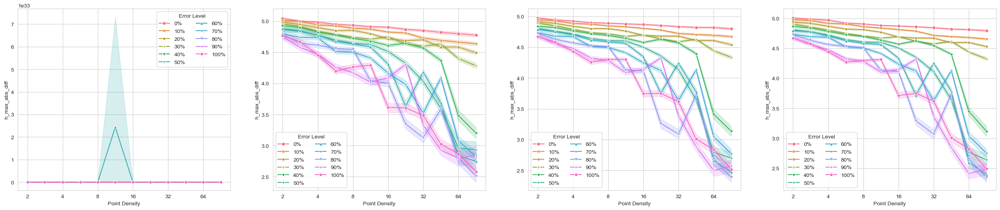

In [233]:
fig, axs = plt.subplots(1, 4, figsize=(32, 6))
for ax, mt, th in zip(axs, [None, is_outlier, modified_z_score, iqr_outliers], [None, 1e1, 3.5, 1.5]):
    lineplot(results, "h_max_abs_diff", ax, outlier_method="group", outlier_func=mt, outlier_threshold=th)

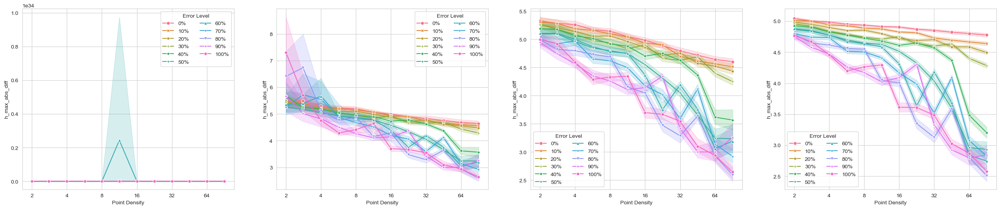

In [201]:
fig, axs = plt.subplots(1, 4, figsize=(32, 6))
for ax, th in zip(axs, [None, 1e3, 1e2, 1e1]):
    lineplot(results, "h_max_abs_diff", ax, outlier_threshold=th)

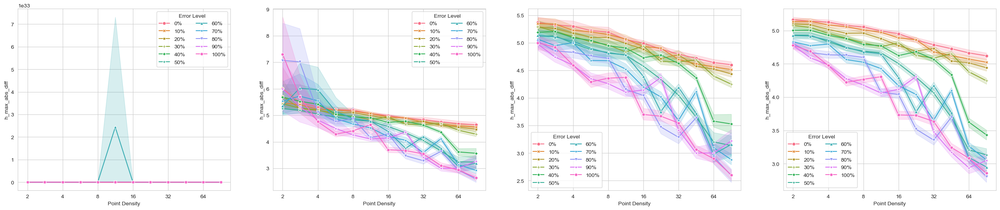

In [202]:
fig, axs = plt.subplots(1, 4, figsize=(32, 6))
for ax, th in zip(axs, [None, 1e3, 1e2, 1e1]):
    lineplot(results, "h_max_abs_diff", ax, outlier_threshold=th, outlier_method="dataset")

## Combined KDE Plots

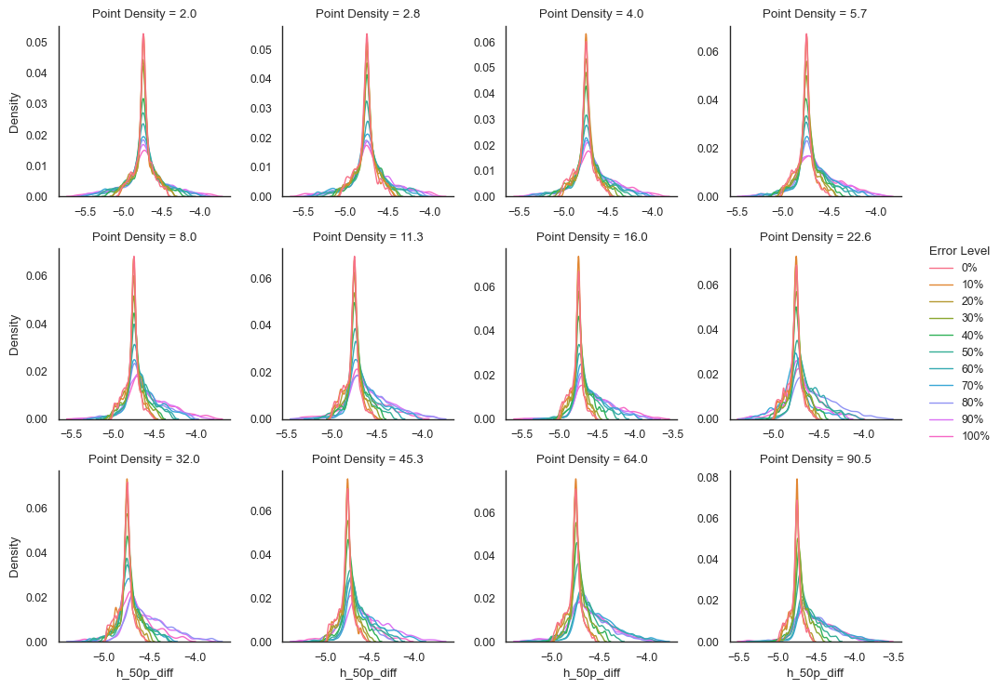

In [41]:
metric = "h_50p_diff"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density", col_wrap=4, kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=2.5, aspect=1, linewidth=1)

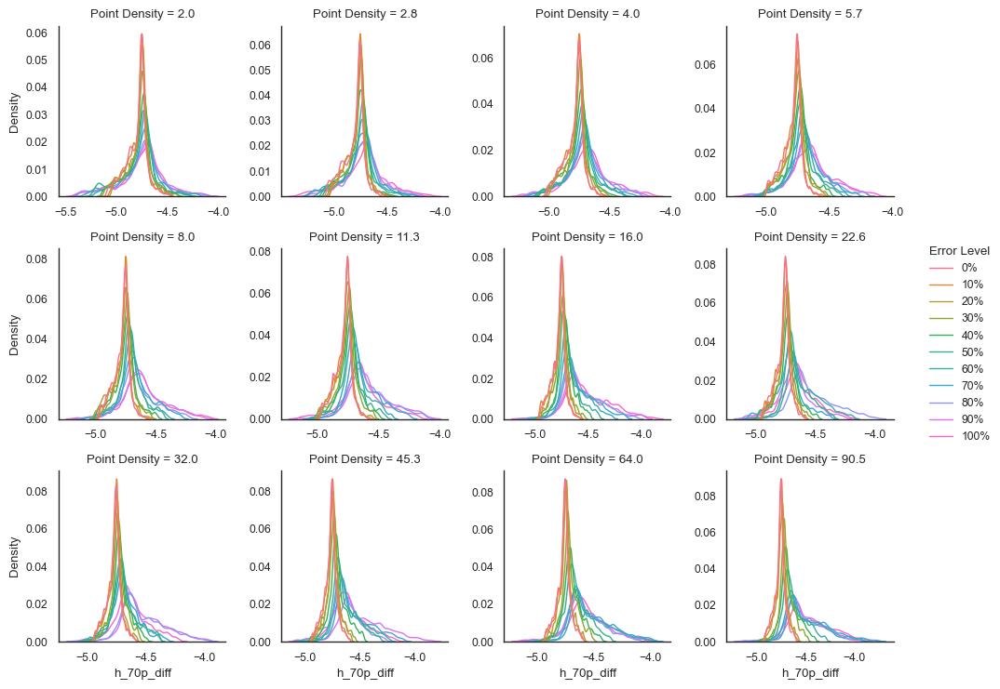

In [ ]:
metric = "h_70p_diff"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density", col_wrap=4, kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=2.5, aspect=1, linewidth=1)

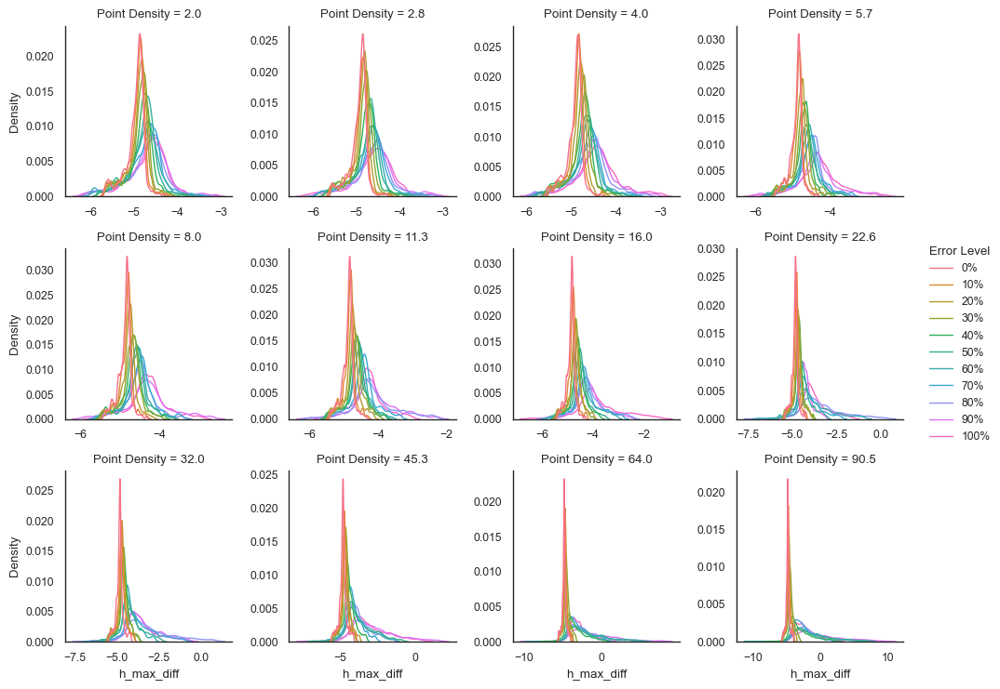

In [42]:
metric = "h_max_diff"
data = results[~is_outlier_by_group(results, metric, outlier_func=modified_z_score)]

sns.set_theme(style="white", context="paper")
g = sns.displot(data=data, x=metric, hue="Error Level", col="Point Density", col_wrap=4, kind="kde", bw_adjust=.5, facet_kws=dict(sharex=False, sharey=False), height=2.5, aspect=1, linewidth=1)

# MultiIndex Stuff

All ways to access rows using a multiindex:

In [ ]:
e.results.loc[(slice(None), "NL.IMBAG.Pand.0344100000000004"), :]

In [ ]:
idx = pd.IndexSlice
e.results.loc[idx[:, "NL.IMBAG.Pand.0344100000000004"], :]

In [ ]:
e.results.xs("NL.IMBAG.Pand.0344100000000004", level=1, axis=0)